In [1]:
import warnings
warnings.filterwarnings("ignore")
import re
import pandas as pd
import numpy as np
import matplotlib as mp
from matplotlib import pyplot as plt
import  seaborn as sns
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.tokenize import word_tokenize

from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
import pickle

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/nobeldhakal/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
df = pd.read_csv('cyberbullying_tweets.csv') 
df.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [4]:
df.shape

(47692, 2)

In [5]:
for i in df['cyberbullying_type'].unique():
   print ( df[df['cyberbullying_type'] == i].head(5))

                                          tweet_text cyberbullying_type
0  In other words #katandandre, your food was cra...  not_cyberbullying
1  Why is #aussietv so white? #MKR #theblock #ImA...  not_cyberbullying
2  @XochitlSuckkks a classy whore? Or more red ve...  not_cyberbullying
3  @Jason_Gio meh. :P  thanks for the heads up, b...  not_cyberbullying
4  @RudhoeEnglish This is an ISIS account pretend...  not_cyberbullying
                                             tweet_text cyberbullying_type
7945  rape is real..zvasiyana nema jokes about being...             gender
7946  You never saw any celebrity say anything like ...             gender
7947  @ManhattaKnight I mean he's gay, but he uses g...             gender
7948  RT @Raul_Novoa16: @AliciaBernardez @Alex_Aim @...             gender
7949  Rape is rape. And the fact that I read one pos...             gender
                                              tweet_text cyberbullying_type
15918  Sudeep, did she invite him though? 

In [6]:
df.isnull().sum()

tweet_text            0
cyberbullying_type    0
dtype: int64

In [7]:
print(df['cyberbullying_type'].value_counts())
print("\nProp_Table (%) \n", round(((df['cyberbullying_type'].value_counts()) / (len(df))) * 100, 2))

cyberbullying_type
religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: count, dtype: int64

Prop_Table (%) 
 cyberbullying_type
religion               16.77
age                    16.76
gender                 16.72
ethnicity              16.69
not_cyberbullying      16.66
other_cyberbullying    16.40
Name: count, dtype: float64


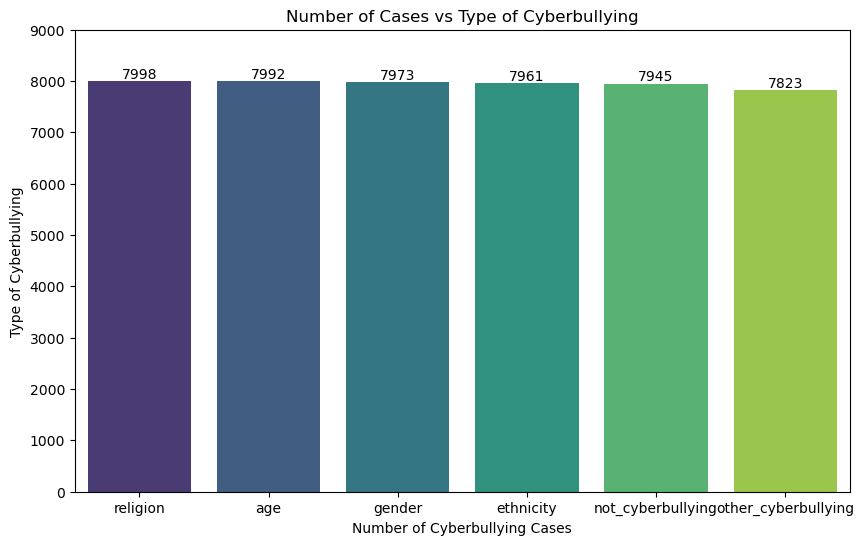

In [8]:
plt.figure(figsize=(10, 6))
grafico = sns.barplot(y=df['cyberbullying_type'].value_counts(), x=df['cyberbullying_type'].value_counts().index, palette='viridis')
grafico.bar_label(grafico.containers[0], fontsize=10)
plt.ylim(0, 9000)
plt.xlabel('Number of Cyberbullying Cases')
plt.ylabel('Type of Cyberbullying')
plt.title('Number of Cases vs Type of Cyberbullying')
plt.show()

In [9]:
print('Total Duplicates: ', df.duplicated().sum())

for i in df['cyberbullying_type'].unique():
    print('Duplicate Values in', i, '=', df[df['cyberbullying_type'] == i].duplicated().sum())


Total Duplicates:  36
Duplicate Values in not_cyberbullying = 8
Duplicate Values in gender = 25
Duplicate Values in religion = 1
Duplicate Values in other_cyberbullying = 0
Duplicate Values in age = 0
Duplicate Values in ethnicity = 2


In [10]:
from langdetect import detect

df['language_en'] = None

for i in range(len(df)):
    try:
        df['language_en'][i] = detect(df['tweet_text'][i]) == 'en'
    except:
        df['language_en'][i] = False

In [11]:
df[df['language_en'] == False].head(5)

,tweet_text,cyberbullying_type,language_en
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying,False
12,Ughhhh #MKR,not_cyberbullying,False
15,@yasmimcaci @Bferrarii PAREM DE FAZER BULLYING...,not_cyberbullying,False
16,"@sarinhacoral @Victor_Maggi tadinhu de mim , s...",not_cyberbullying,False
21,Kids Love😘❤ @ Mohamad Bin Zayed City مدينة محم...,not_cyberbullying,False


In [12]:
frequencias_non_english = df[df['language_en'] == False].groupby('cyberbullying_type').size()
print(frequencias_non_english)

cyberbullying_type
age                      48
ethnicity               445
gender                  306
not_cyberbullying      1296
other_cyberbullying     904
religion                 33
dtype: int64


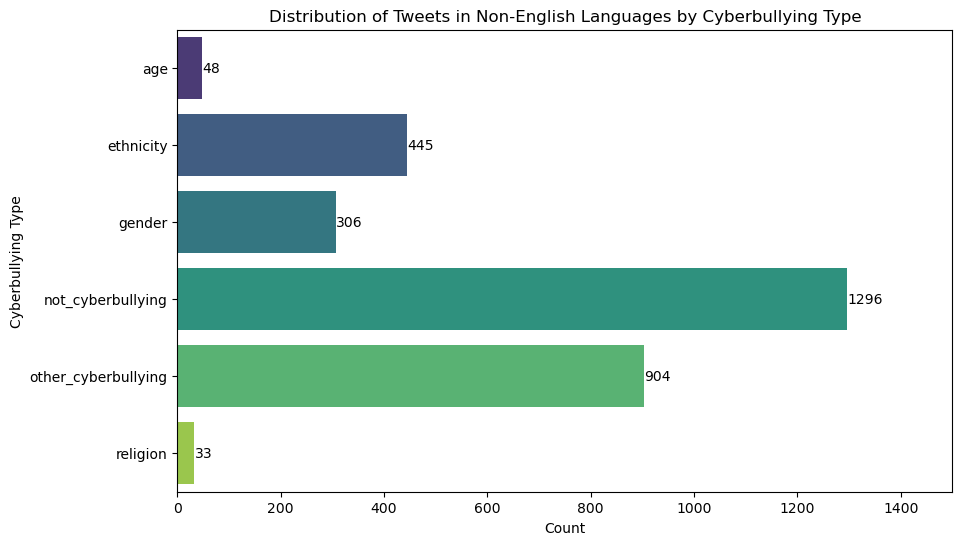

In [13]:
plt.figure(figsize=(10, 6))
grafico = sns.barplot(x=frequencias_non_english.values, y=frequencias_non_english.index, palette='viridis')
grafico.bar_label(grafico.containers[0], fontsize=10)

plt.title('Distribution of Tweets in Non-English Languages by Cyberbullying Type')
plt.xlabel('Count')
plt.ylabel('Cyberbullying Type')
plt.xlim(0, 1500)

plt.show()

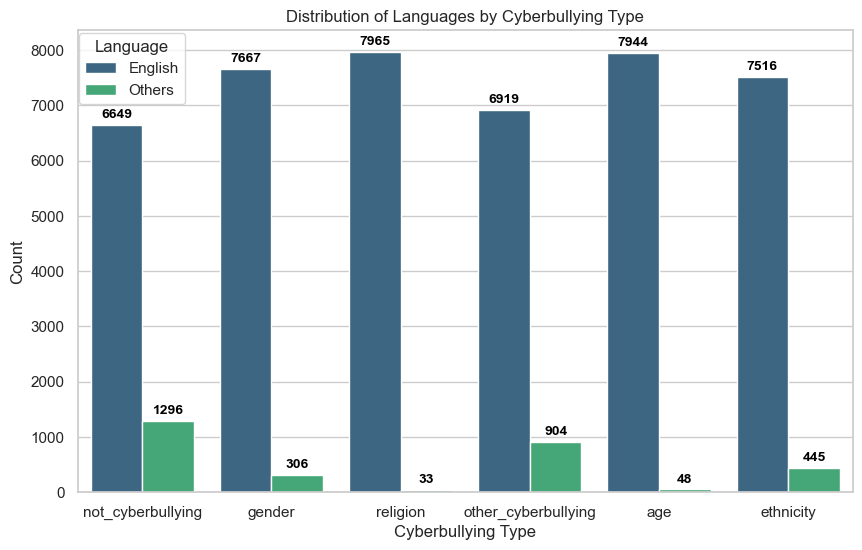

In [14]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
grafico = sns.countplot(x='cyberbullying_type', hue='language_en', data=df, palette='viridis', hue_order=[True, False])

plt.title('Distribution of Languages by Cyberbullying Type')
plt.xlabel('Cyberbullying Type')
plt.ylabel('Count')

plt.legend(title='Language', labels=['English', 'Others'], bbox_to_anchor=(0.07, 1.01), loc='upper center')

grafico.bar_label(grafico.containers[0], fmt='%d', label_type='edge', fontsize=10, color='black', weight='bold', padding=3)
grafico.bar_label(grafico.containers[1], fmt='%d', label_type='edge', fontsize=10, color='black', weight='bold', padding=3)

plt.show()

In [15]:
df = df.drop_duplicates()

df.reset_index(drop=True, inplace=True)

In [16]:
df = df[df["language_en"]].iloc[:, :-1].copy()
df.reset_index(drop=True, inplace=True)

In [17]:
print(df['cyberbullying_type'].value_counts())
print("\nProp_Table (%) \n", round(((df['cyberbullying_type'].value_counts())/(len(df)))*100,2))

cyberbullying_type
religion               7964
age                    7944
gender                 7643
ethnicity              7514
other_cyberbullying    6919
not_cyberbullying      6641
Name: count, dtype: int64

Prop_Table (%) 
 cyberbullying_type
religion               17.85
age                    17.80
gender                 17.13
ethnicity              16.84
other_cyberbullying    15.50
not_cyberbullying      14.88
Name: count, dtype: float64


In [18]:
def expand_contractions(text):
    dict_conts = {"ain't": "are not", "'s": " is", "aren't": "are not", "'re": " are", "'t": " not", " nt ": " not ", " u ":" you "}
    
    re_cont = re.compile('(%s)' % '|'.join(dict_conts.keys()))
    
    def replace(match):
        return dict_conts[match.group(0)]
    
    return re_cont.sub(replace, text)

In [19]:
def expand_hashtag(text):
    pattern = re.compile(r'#(\w+)')
    found_hashtags = re.finditer(pattern, text)
    
    for match in found_hashtags:
        spaced_hashtag = re.sub(r'([a-z0-9])([A-Z])', r'\1 \2', match.group(1))
        text = text.replace(match.group(), spaced_hashtag)
        
    return text


In [20]:
text = 'Testing the function #callHashtag for expansion of #TestHashtags'
text = expand_hashtag(text)
print(text)

Testing the function call Hashtag for expansion of Test Hashtags


In [21]:
def pre_process_regex(text):
    from nltk.tokenize import TweetTokenizer
    import emoji
    from nltk.corpus import stopwords

    tweet_tokenizer = TweetTokenizer()
    stop_words = set(stopwords.words('english'))
    stop_words.update(['rt'])

    mention_pattern = re.compile(r'(?:rt)?@(\w+)') 
    link_pattern = re.compile(r'https?://\S+|(www\.\S+)|(bit\.ly/\S+)|tinyurl\.\S+')

    text = expand_hashtag(text)
    text = text.lower()
    text = re.sub(mention_pattern, "", text)
    text = re.sub(link_pattern, "", text)
    text = expand_contractions(text)

    text = re.sub(r':|_|-', " ", text)
    text = emoji.demojize(text)
    text = re.sub(r'[^a-zA-Z\s:]', " ", text)
    text = emoji.emojize(text)

    text = re.sub(r'\s+', " ", text)
    text = re.sub(r'\s\w\s', " ", text)
    text = re.sub(r'^\s+|\s+$', '', text)
    text = ' '.join([word for word in tweet_tokenizer.tokenize(text) if word not in stop_words])

    return text


In [22]:
!pip install emoji

In [23]:
text = 'Bullying is __ - () 😡 ..,.1.1 '
print(pre_process_regex(text))

bullying : enraged face :


In [24]:
import emoji

# Convert the emoji name back to the actual emoji
text_with_emoji = emoji.emojize('bullying :enraged_face:')
print(text_with_emoji)


bullying 😡


In [25]:
def calculate_feature_count(text):
    import demoji
    
    mention_pattern = re.compile(r'(?:rt)?@(\w+)')
    hashtag_pattern = re.compile(r'#(\w+)')
    link_pattern = re.compile(r'https?://\S+|(www\.\S+)|(bit\.ly\/\S+)|tinyurl\.\S+')

    mention_count = len(re.findall(mention_pattern, text))
    hashtag_count = len(re.findall(hashtag_pattern, text))
    link_count = len(re.findall(link_pattern, text))
    emoji_count = len(demoji.findall_list(text))

    return mention_count, hashtag_count, link_count, emoji_count


In [26]:
df_feature_count = pd.DataFrame(0, index=range(len(df)), columns=['mention_count', 'hashtag_count', 'link_count', 'emoji_count', 
                                        'regex_char_count','stem_char_count',
                                        'regex_word_count','stem_word_count'],
                                        )
df_feature_count['cyberbullying_type']=''


In [27]:
from nltk.tokenize import TweetTokenizer 
tweet_tokenizer = TweetTokenizer()

df_emojis = pd.DataFrame(columns=['cyberbullying_type', 'index', 'tweet_emojis'])

df['tweet_text_regex'] = df['tweet_text_stem'] = ''  

ps = PorterStemmer()
lemmatizer = WordNetLemmatizer()
tweet_list = df['tweet_text']
                      
for index, tweet in enumerate(tweet_list):
    
    df_feature_count['mention_count'][index], df_feature_count['hashtag_count'][index], df_feature_count['link_count'][index], df_feature_count['emoji_count'][index] = calculate_feature_count(tweet)
    df_feature_count['cyberbullying_type'][index] = df['cyberbullying_type'][index]   

    tweet = pre_process_regex(tweet)
    df['tweet_text_regex'][index] = tweet
    df_feature_count['regex_char_count'][index] = len(tweet)
    df_feature_count['regex_word_count'][index] = len(set(tweet_tokenizer.tokenize(tweet)))

    df['tweet_text_stem'][index] = ' '.join([ps.stem(words) for words in tweet_tokenizer.tokenize(tweet)])
    df_feature_count['stem_char_count'][index] = len(tweet) - df_feature_count['emoji_count'][index]
    df_feature_count['stem_word_count'][index] = len(set(tweet_tokenizer.tokenize(tweet)))


In [28]:
df.iloc[146]

tweet_text            RT @jurijuri: @freebsdgirl It's like Total Rec...
cyberbullying_type                                    not_cyberbullying
tweet_text_regex                    like total recall two breasts maybe
tweet_text_stem                        like total recal two breast mayb
Name: 146, dtype: object

In [29]:
for feature in df_feature_count.columns[:8]:
    stats = round(df_feature_count.groupby('cyberbullying_type')[feature].describe(), 2)
    print(f"\nStatistics for {feature} \n{stats}")



Statistics for mention_count 
                      count  mean   std  min  25%  50%  75%   max
cyberbullying_type                                               
age                  7944.0  0.06  0.39  0.0  0.0  0.0  0.0  12.0
ethnicity            7514.0  0.60  0.89  0.0  0.0  0.0  1.0   9.0
gender               7643.0  0.57  0.90  0.0  0.0  0.0  1.0  17.0
not_cyberbullying    6641.0  0.80  1.08  0.0  0.0  1.0  1.0  16.0
other_cyberbullying  6919.0  0.88  1.26  0.0  0.0  1.0  1.0  51.0
religion             7964.0  0.52  1.07  0.0  0.0  0.0  1.0  17.0

Statistics for hashtag_count 
                      count  mean   std  min  25%  50%  75%   max
cyberbullying_type                                               
age                  7944.0  0.09  0.56  0.0  0.0  0.0  0.0  13.0
ethnicity            7514.0  0.14  0.64  0.0  0.0  0.0  0.0  17.0
gender               7643.0  0.33  0.92  0.0  0.0  0.0  0.0  21.0
not_cyberbullying    6641.0  0.44  0.82  0.0  0.0  0.0  1.0  10.0
other_cyberbul

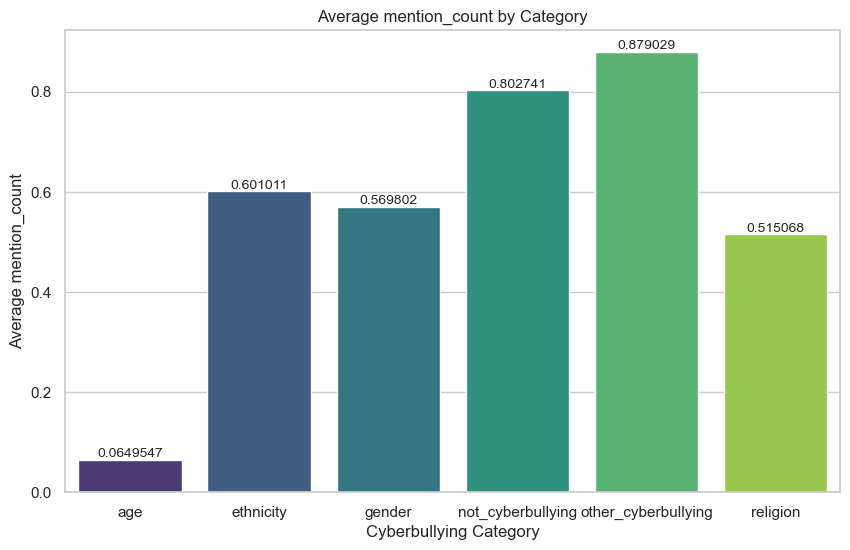

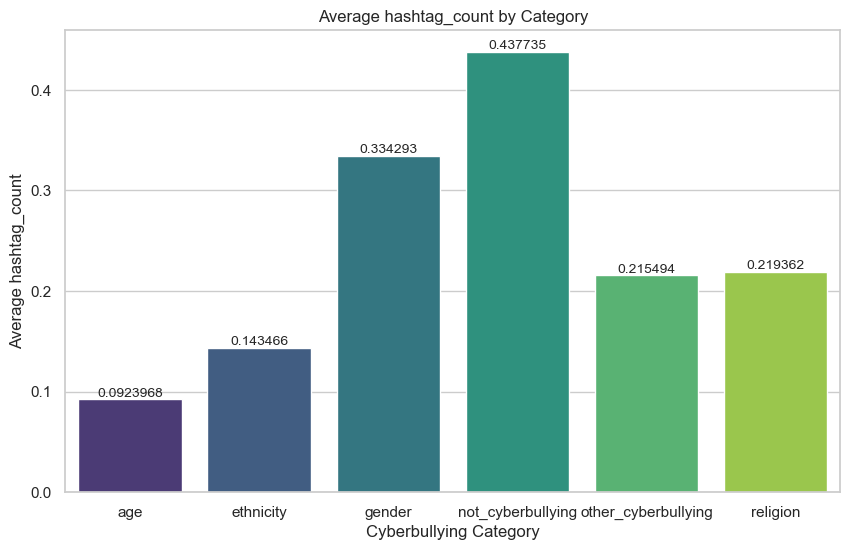

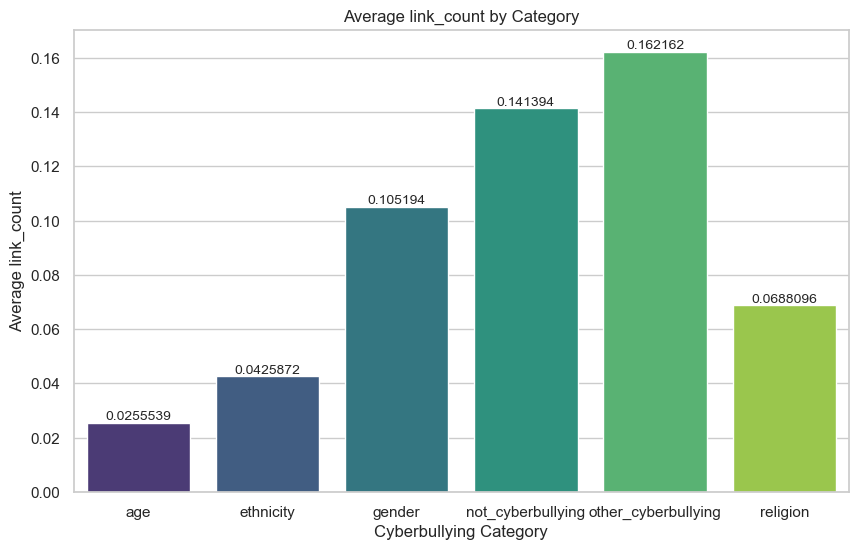

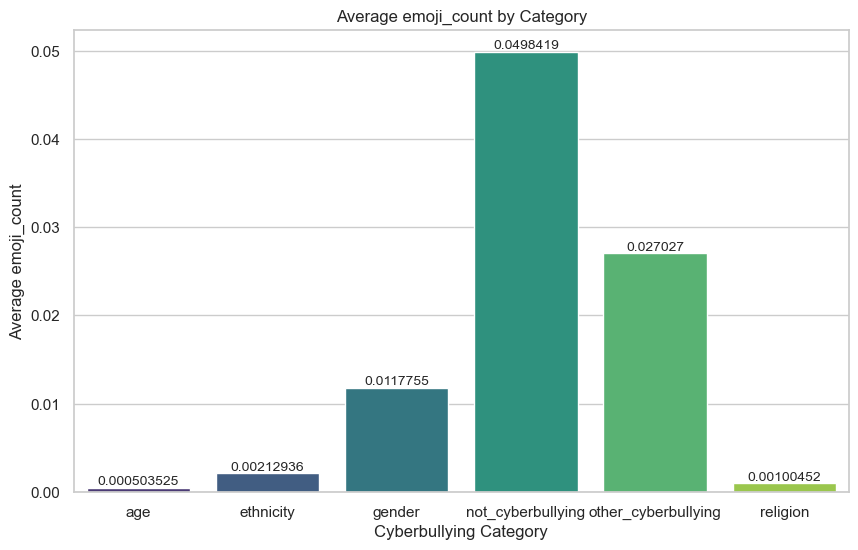

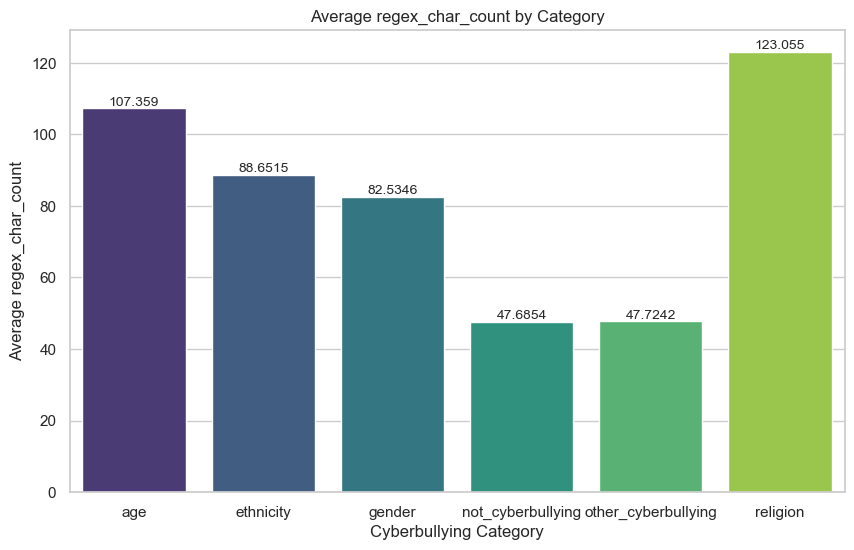

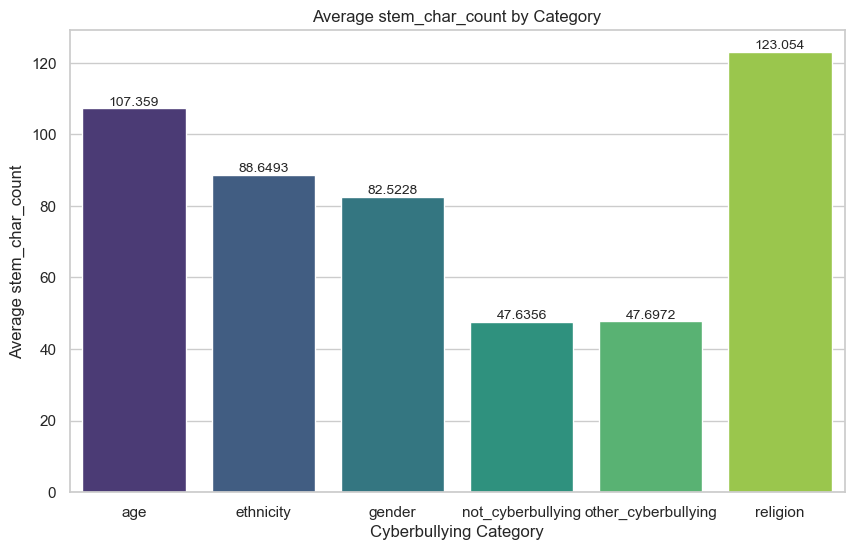

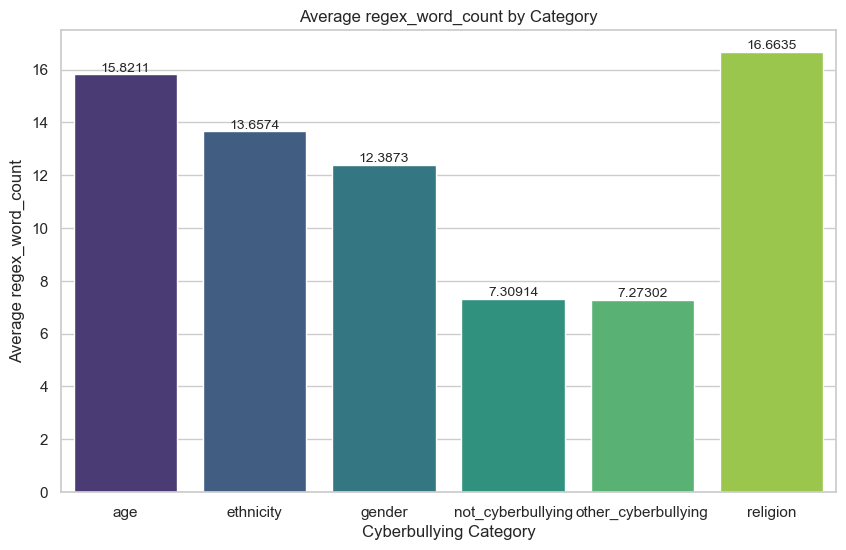

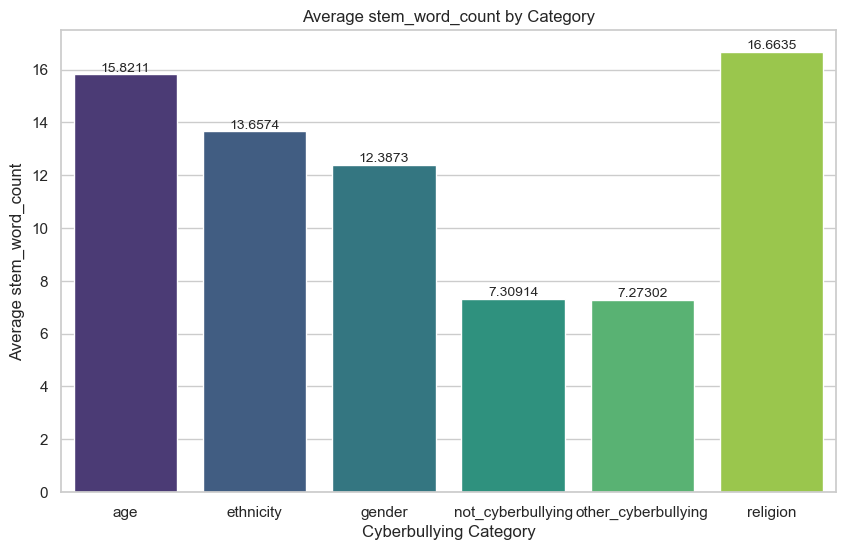

In [30]:
for feature in df_feature_count.columns[:8]:
    feature_mean = df_feature_count.groupby('cyberbullying_type')[feature].mean()

    plt.figure(figsize=(10, 6))
    chart = sns.barplot(x=feature_mean.index, y=feature_mean.values, palette='viridis')
    chart.bar_label(chart.containers[0], fontsize=10)

    plt.title(f'Average {feature} by Category')
    plt.xlabel('Cyberbullying Category')
    plt.ylabel(f'Average {feature}')
    plt.show()


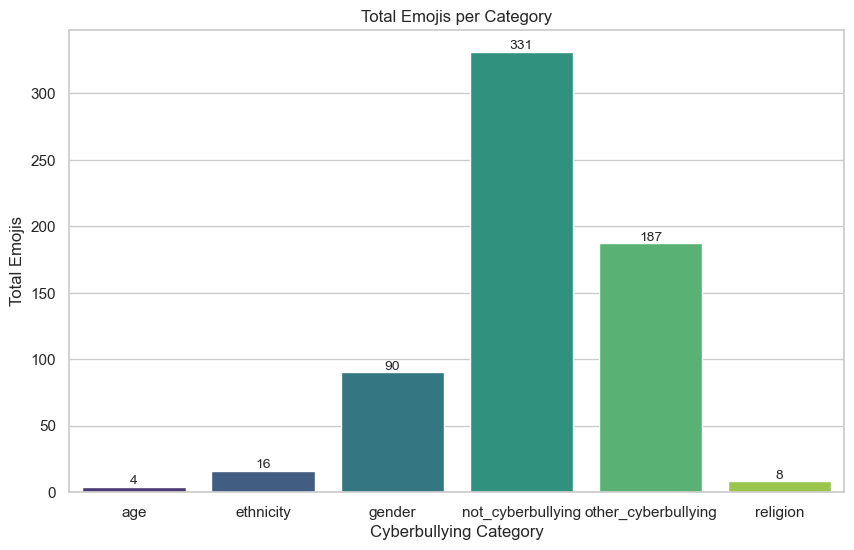

In [31]:
total_emojis_per_category = df_feature_count.groupby('cyberbullying_type')['emoji_count'].sum()
plt.figure(figsize=(10, 6))
chart = sns.barplot(x=total_emojis_per_category.index, y=total_emojis_per_category.values, palette='viridis')
chart.bar_label(chart.containers[0], fontsize=10)
plt.title('Total Emojis per Category')
plt.xlabel('Cyberbullying Category')
plt.ylabel('Total Emojis')
plt.show()

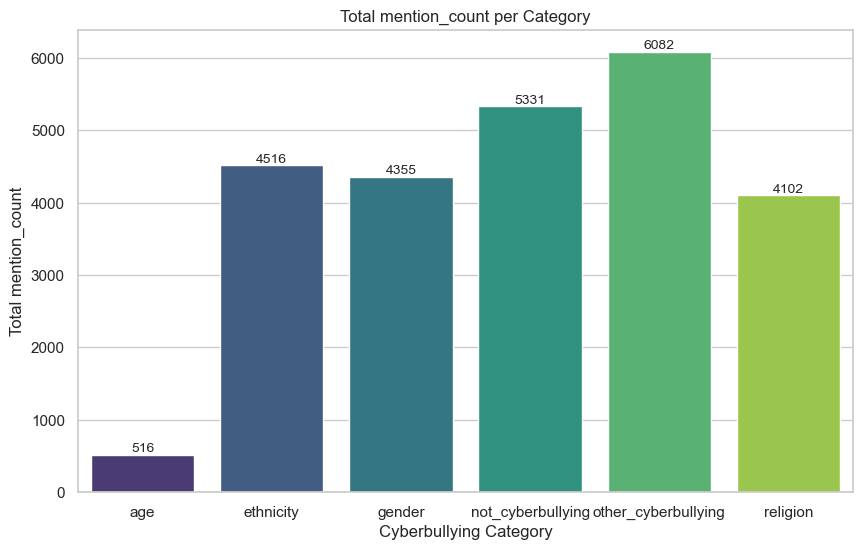

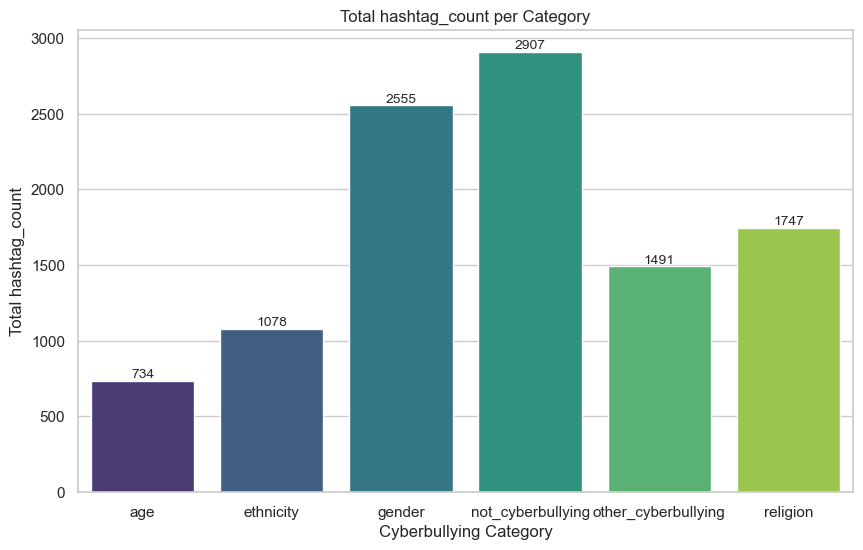

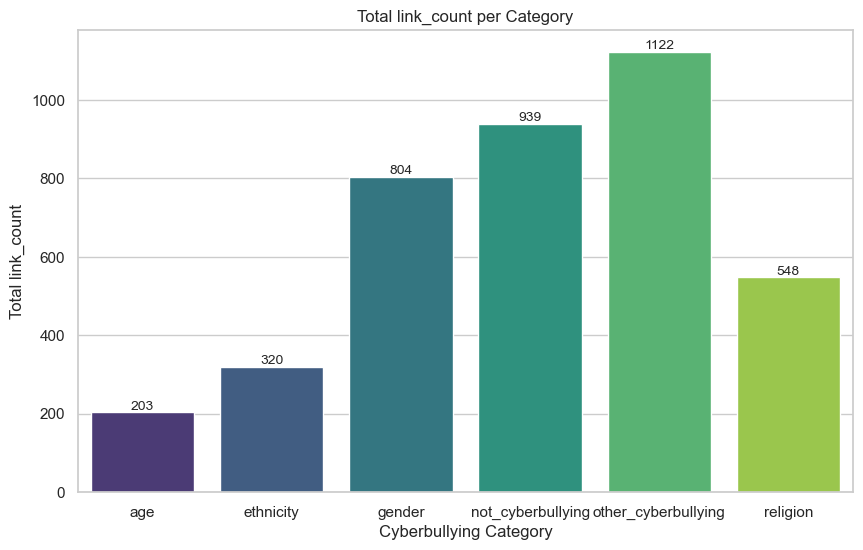

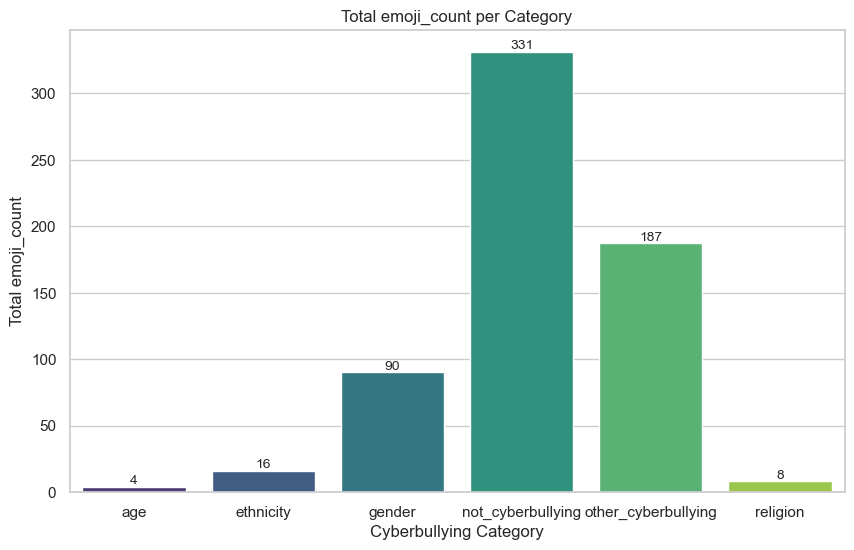

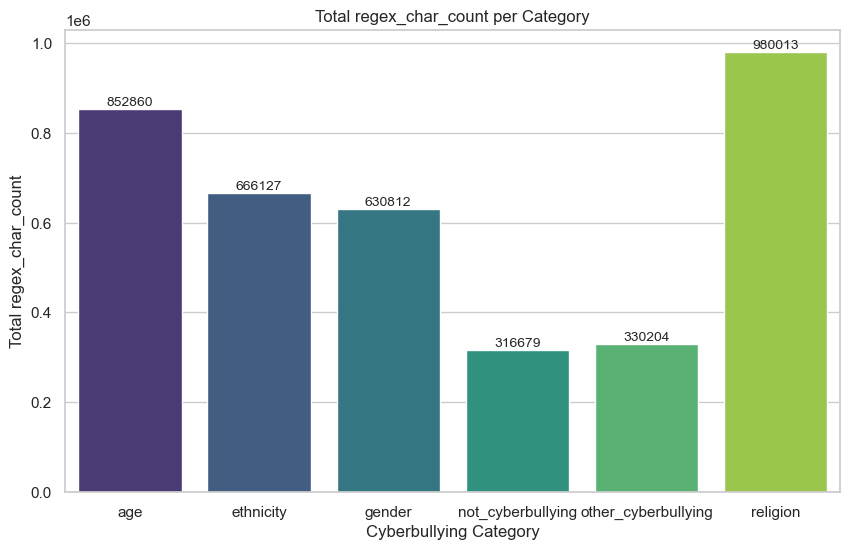

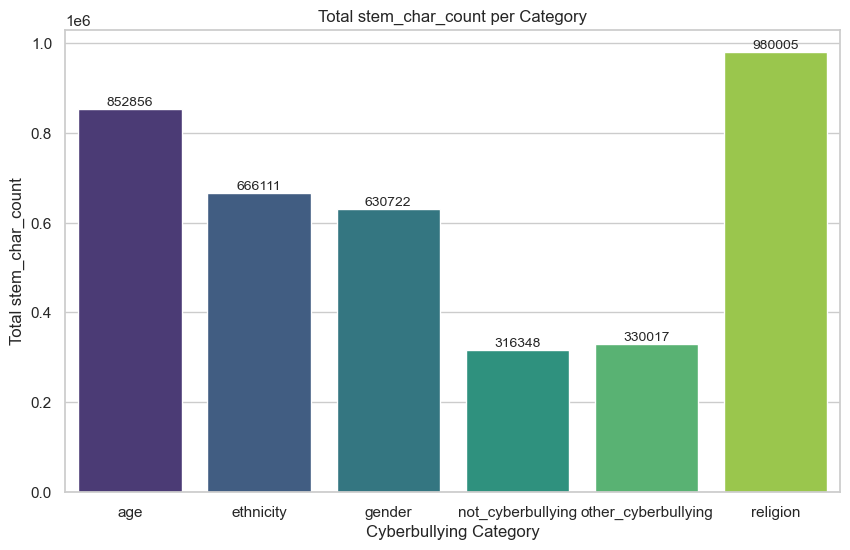

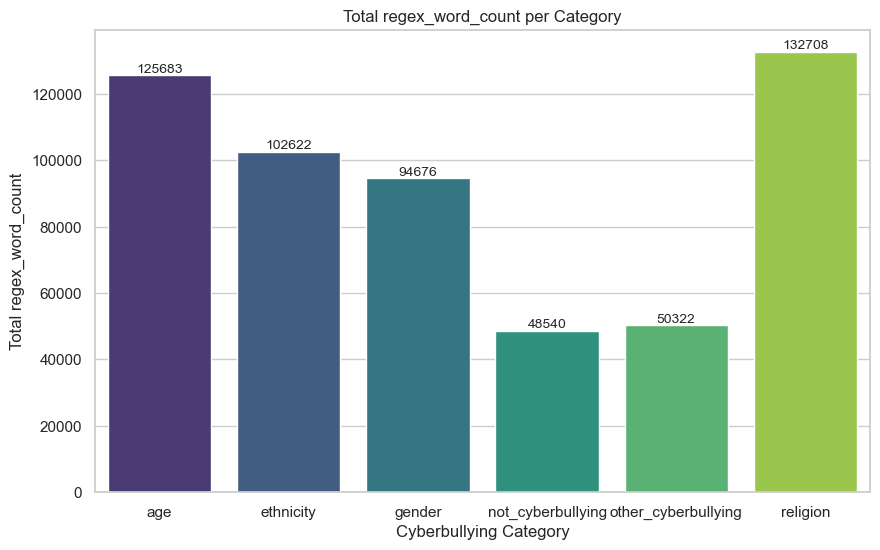

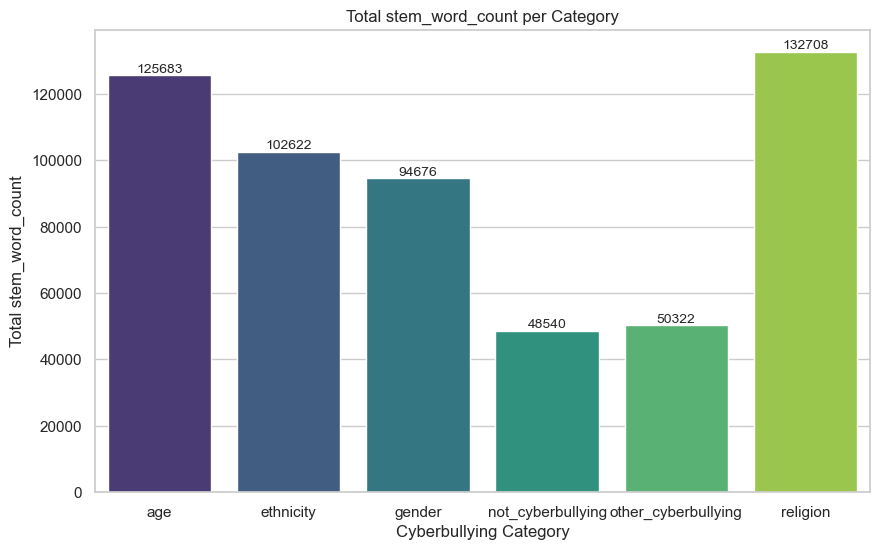

In [32]:
# Total feature bar charts by category grouped by cyberbullying_type

for feature in df_feature_count.columns[:8]:    
    total_feature_per_category = df_feature_count.groupby('cyberbullying_type')[feature].sum()
    plt.figure(figsize=(10, 6))
    chart = sns.barplot(x=total_feature_per_category.index, y=total_feature_per_category.values, palette='viridis')
    chart.bar_label(chart.containers[0], fontsize=10)
    plt.title(f'Total {feature} per Category')
    plt.xlabel('Cyberbullying Category')
    plt.ylabel(f'Total {feature}')
    plt.show()


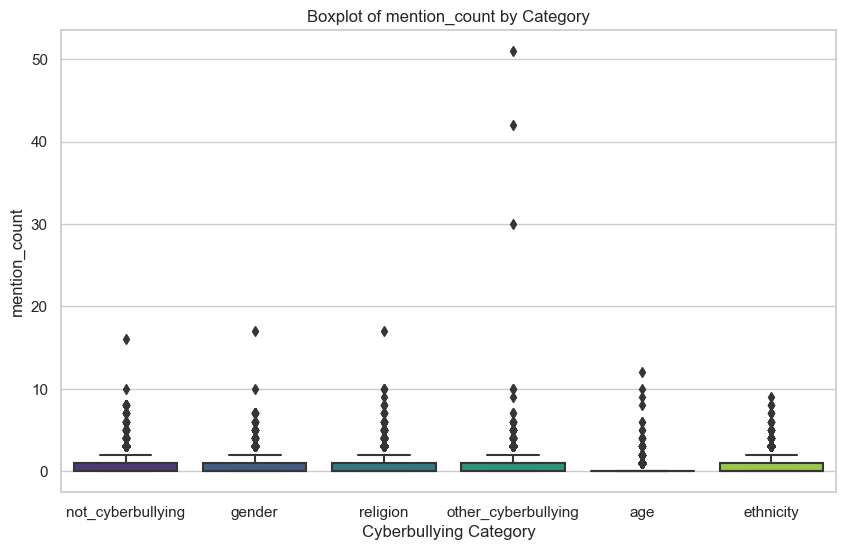

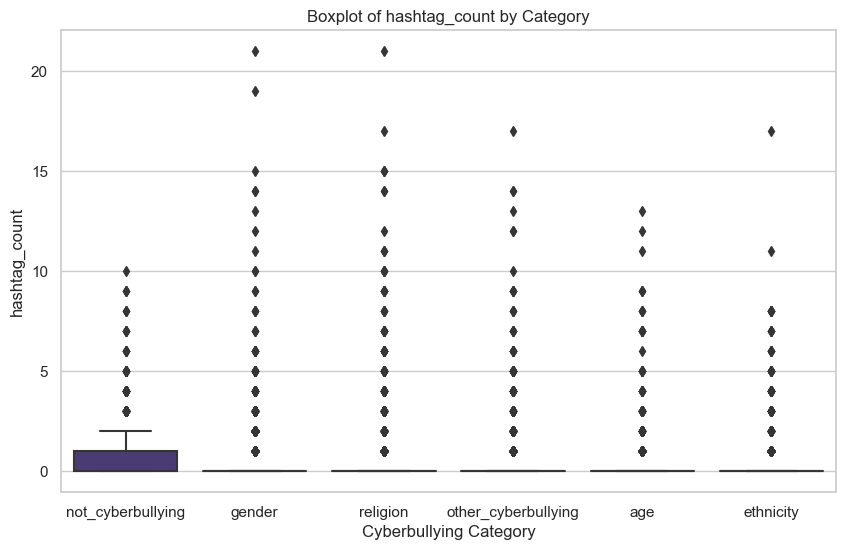

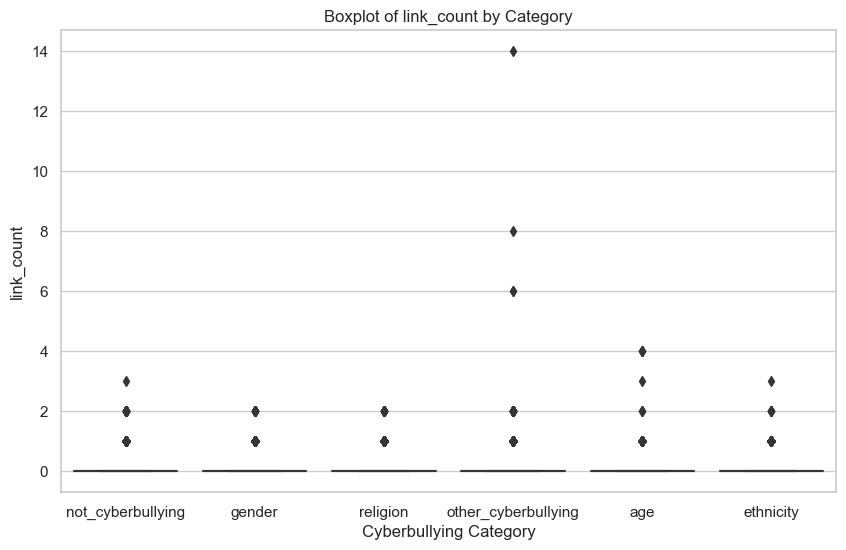

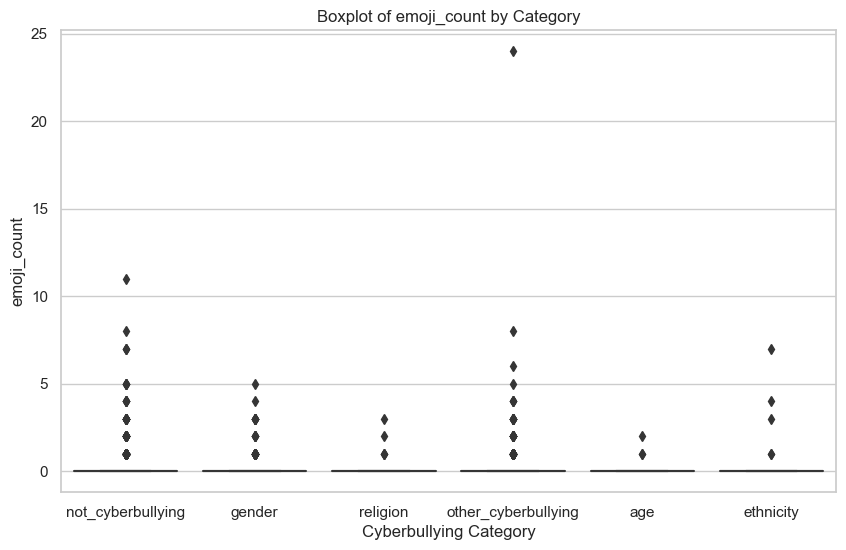

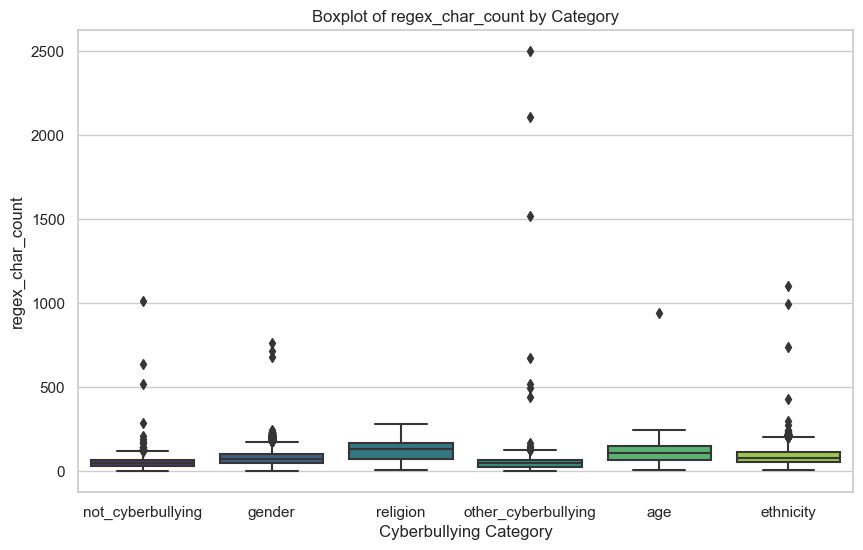

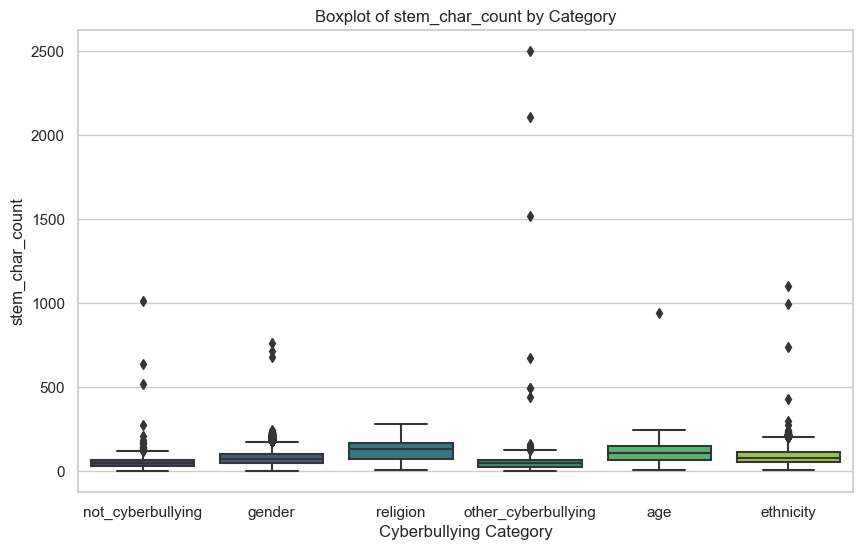

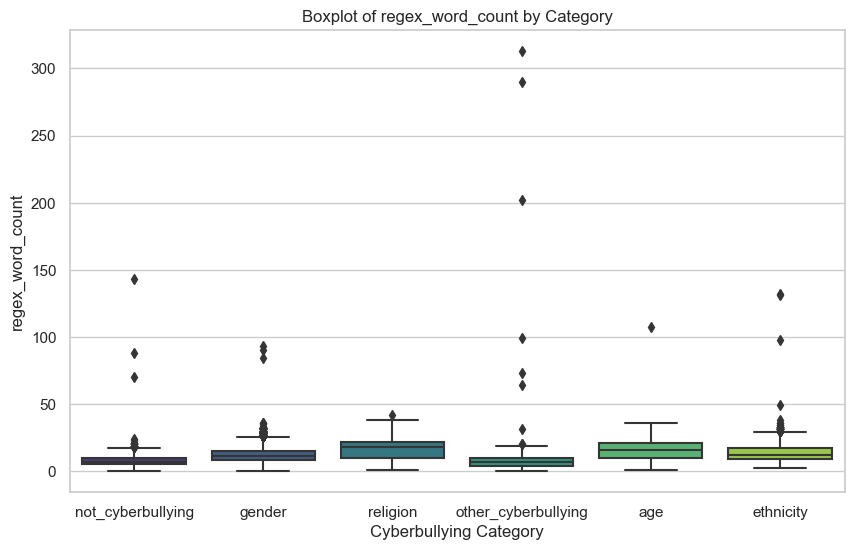

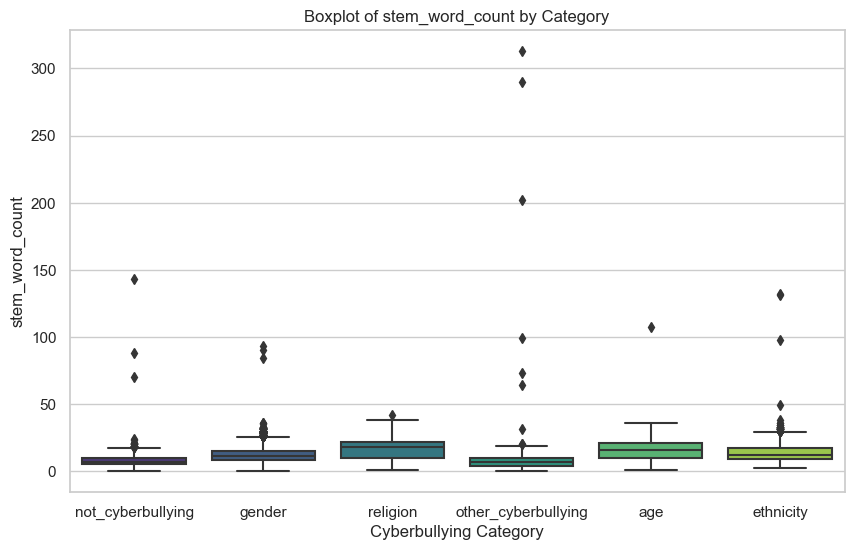

In [33]:
# Boxplot of feature distribution by 'cyberbullying_type' category

for feature in df_feature_count.columns[:8]:
    plt.figure(figsize=(10, 6))

    sns.boxplot(x='cyberbullying_type', y=feature, data=df_feature_count, palette='viridis')

    plt.title(f'Boxplot of {feature} by Category')
    plt.xlabel('Cyberbullying Category')
    plt.ylabel(feature)

    # Use logarithmic scale if the feature is word or character count
    if feature in ['word_count', 'char_count']:
        plt.yscale('log')

    plt.show()


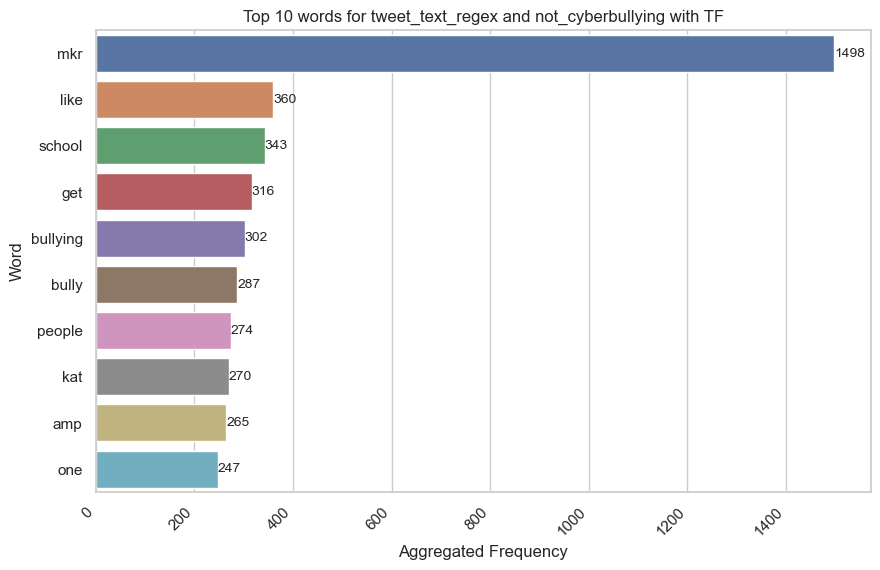

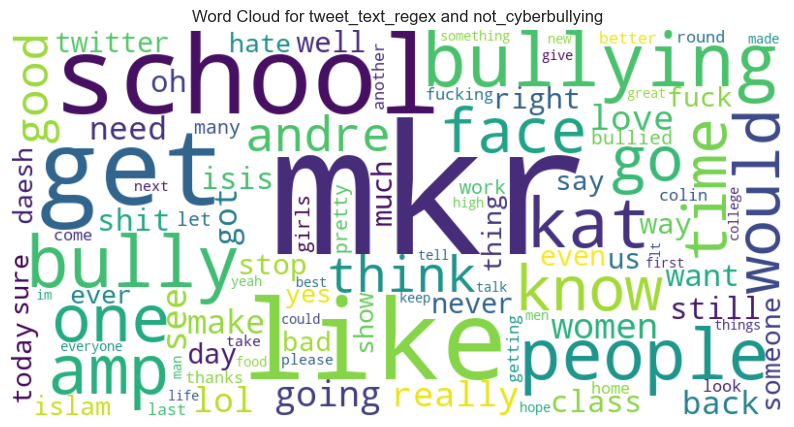

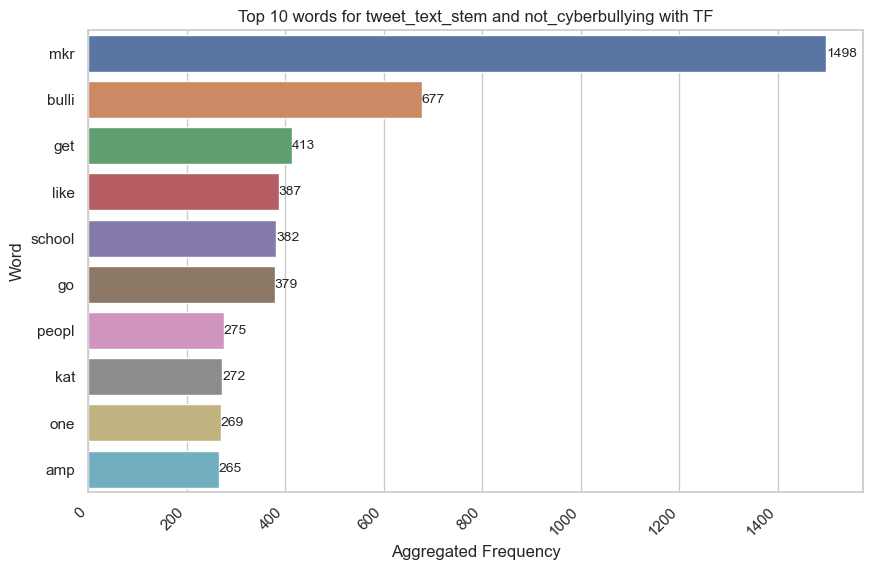

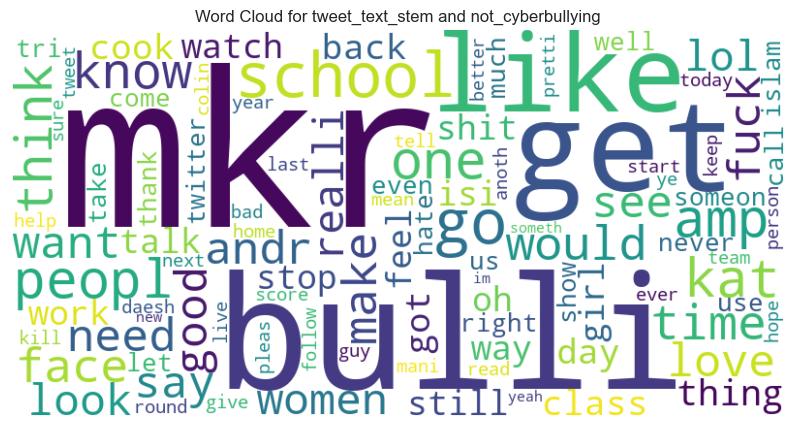

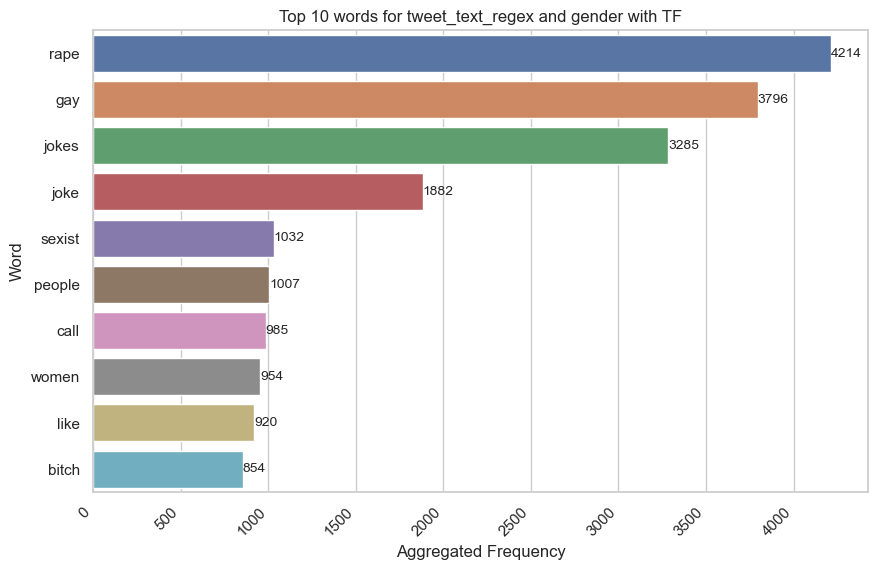

...

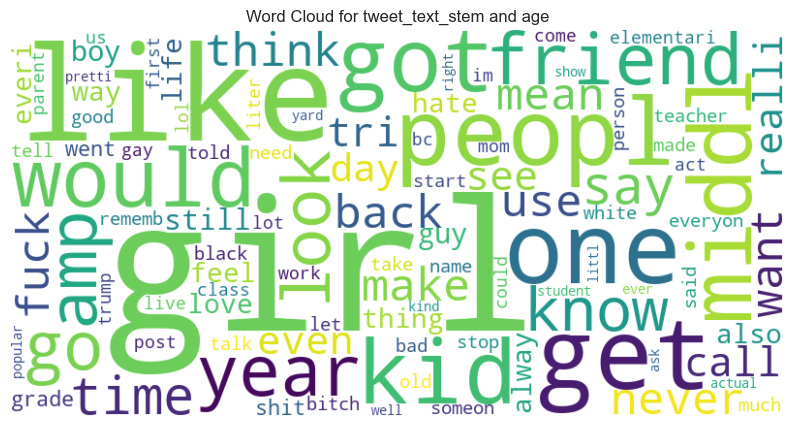

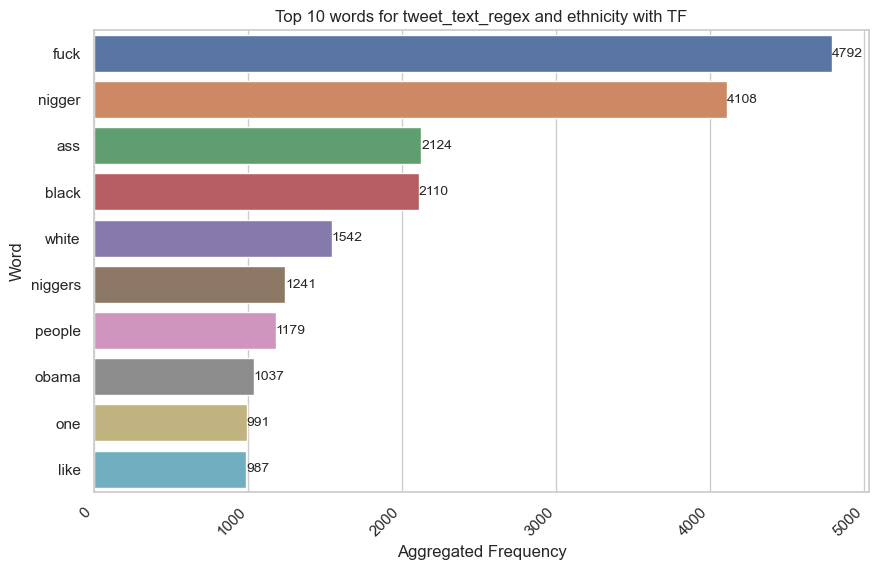

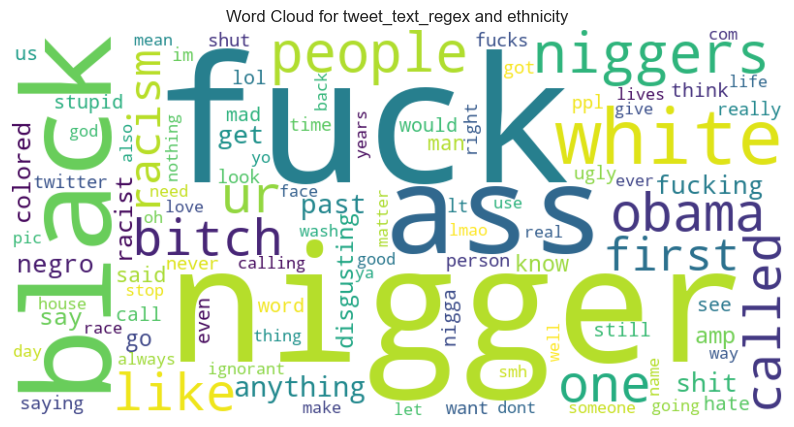

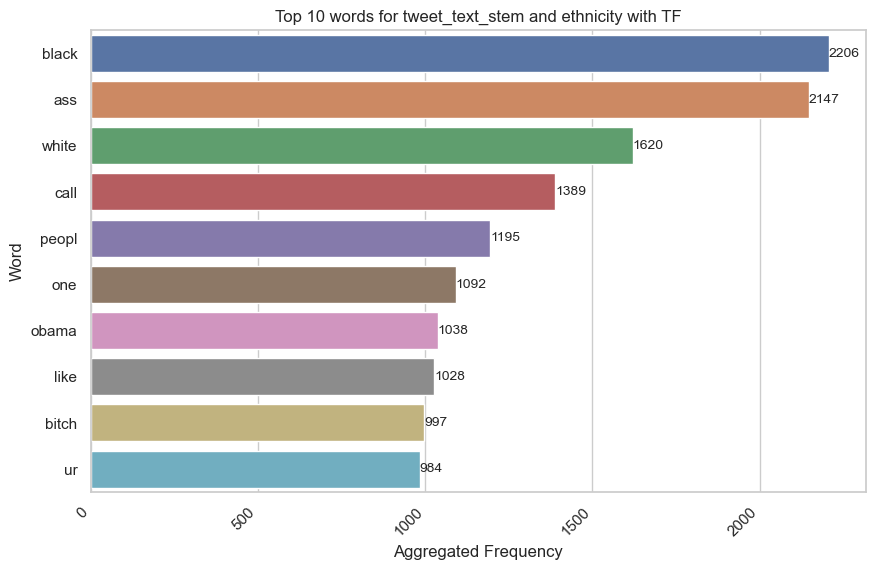

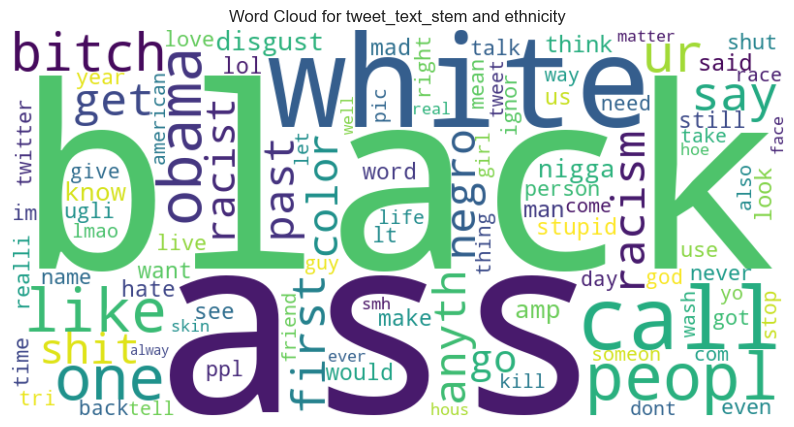

In [34]:
from sklearn.feature_extraction.text import CountVectorizer

dict_bow = {}

for classe_cb in df['cyberbullying_type'].unique():
    for prep_proc_type in ['tweet_text_regex', 'tweet_text_stem']:
    
        vectorizer = CountVectorizer(max_features=2000, min_df=50, max_df=0.6)
        corpus = df[prep_proc_type][df['cyberbullying_type'] == classe_cb]
        X = vectorizer.fit_transform(corpus).toarray()
        feature_names = vectorizer.get_feature_names_out()
     
        df_bow = pd.DataFrame(X, columns=feature_names)
       
        dict_bow[(classe_cb, prep_proc_type)] = {'matrix': X, 'word_list': feature_names}
          
        top_10_words = df_bow.sum().nlargest(10)
    
        plt.figure(figsize=(10, 6))
        chart = sns.barplot(x=top_10_words.values, y=top_10_words.index)    
        chart.bar_label(chart.containers[0], fontsize=10)
        plt.title(f'Top 10 words for {prep_proc_type} and {classe_cb} with TF')
        plt.xlabel('Aggregated Frequency')
        plt.ylabel('Word')
        plt.xticks(rotation=45, ha='right')
        plt.show()
        
        wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(df_bow.sum())
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {prep_proc_type} and {classe_cb}')
        plt.axis('off')
        plt.show()


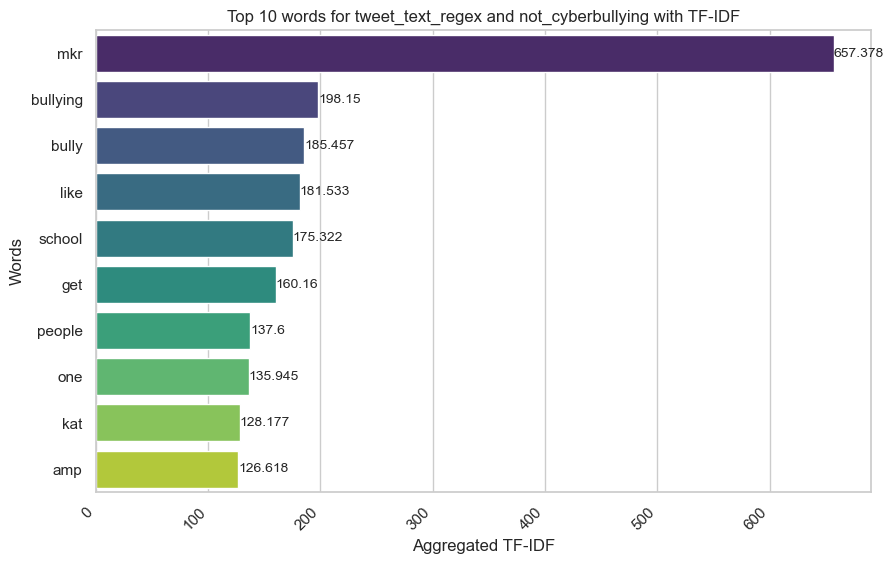

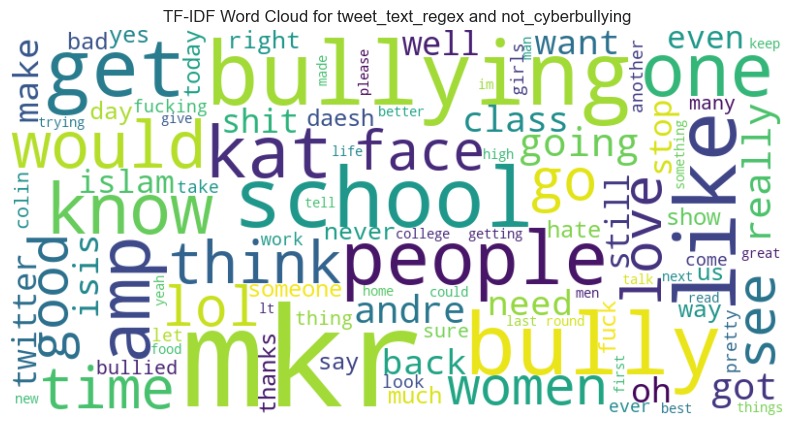

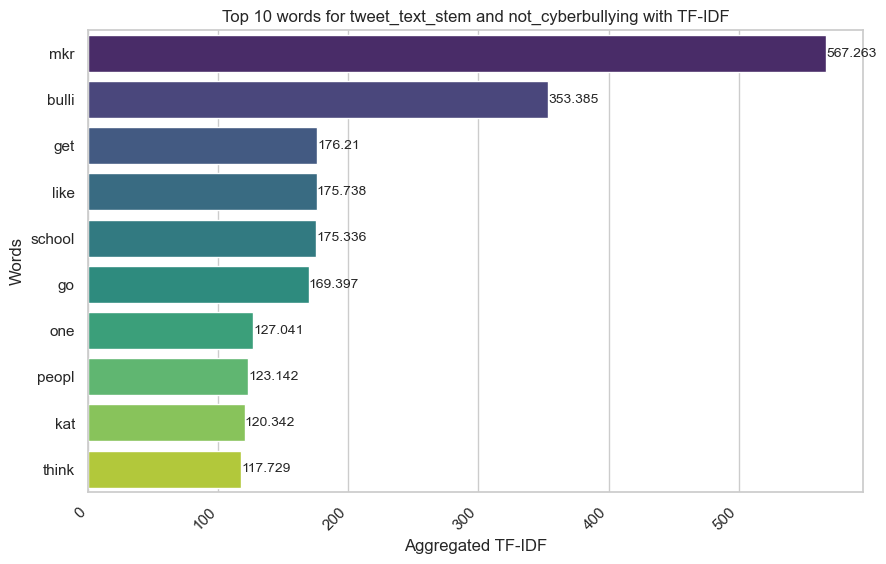

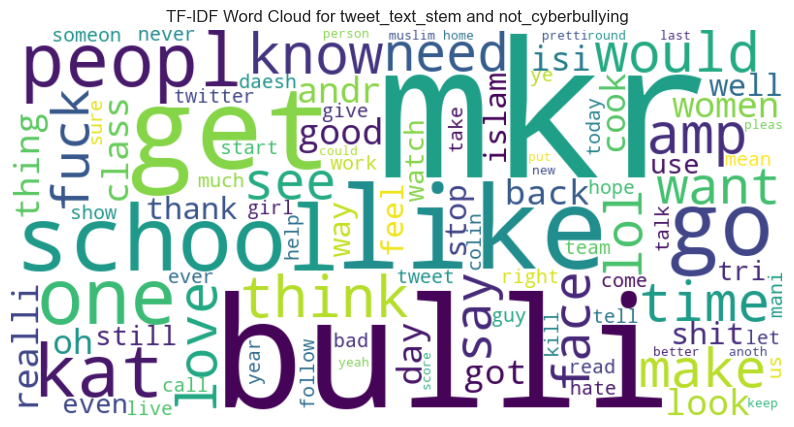

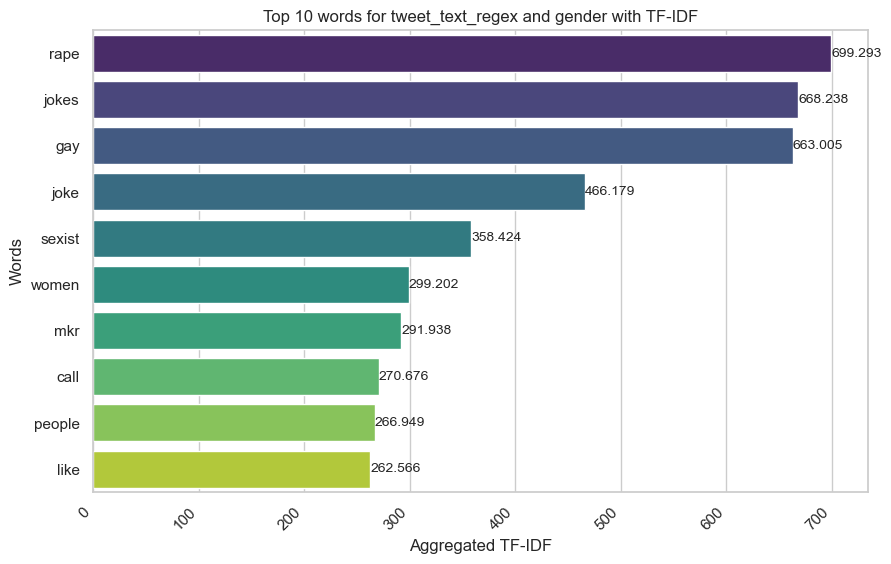

...

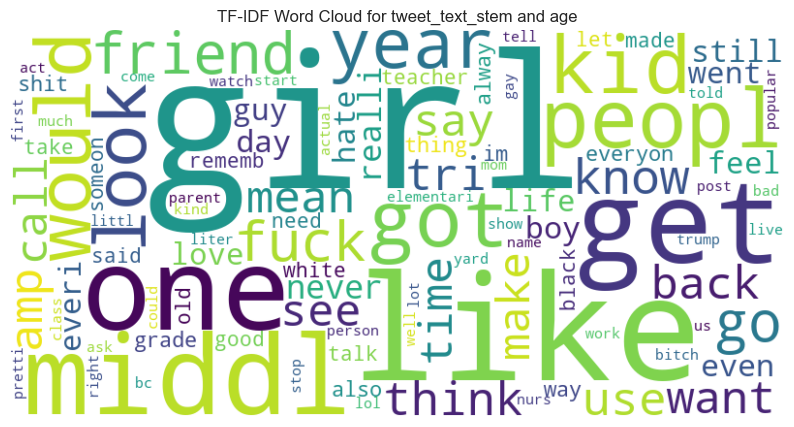

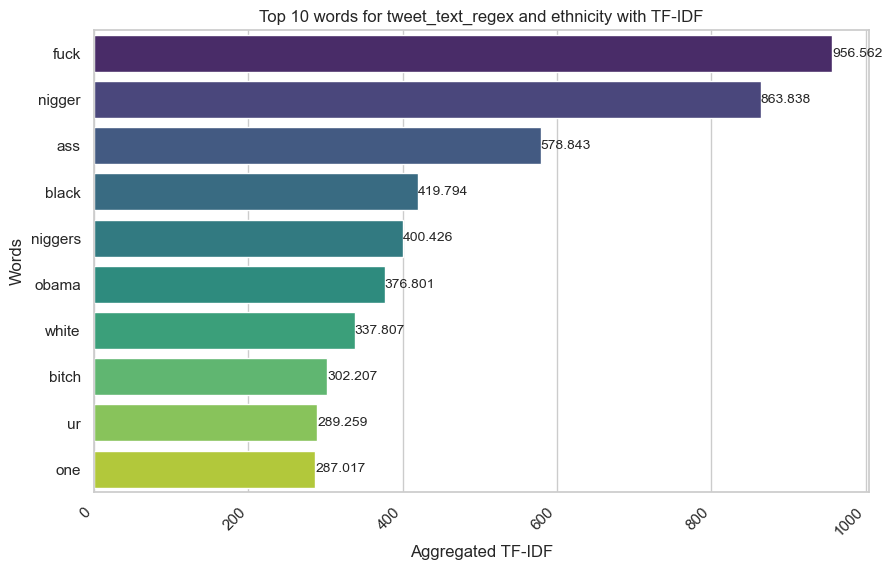

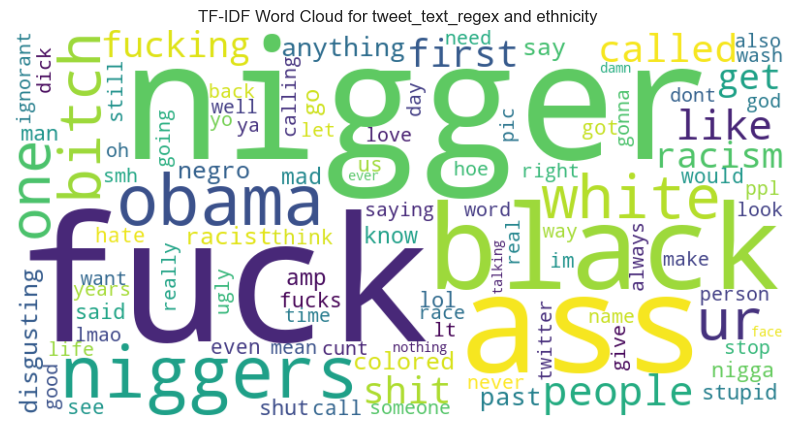

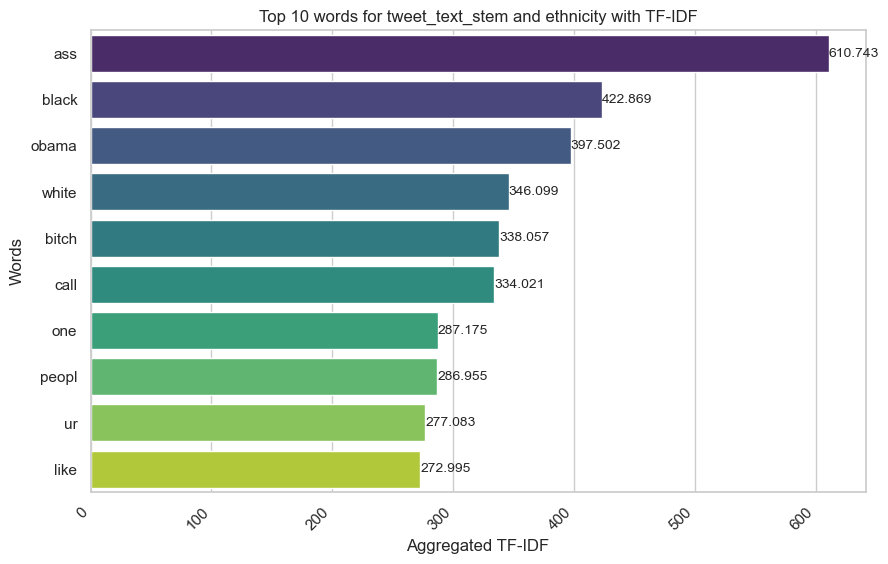

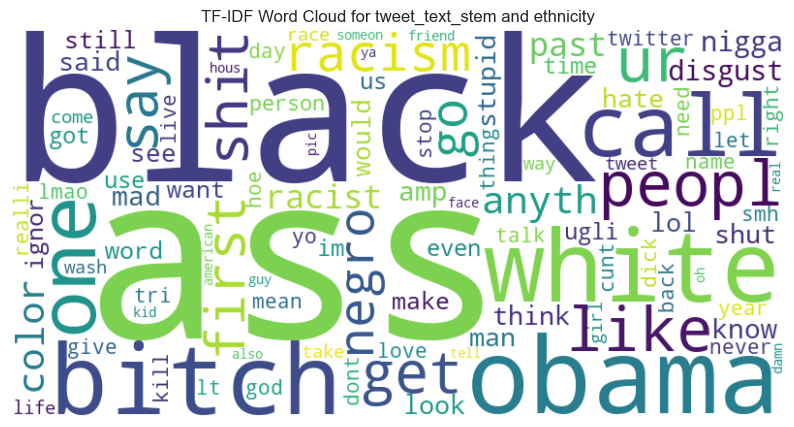

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer

dict_tfidf = {}

for classe_cb in df['cyberbullying_type'].unique():
    for prep_proc_type in ['tweet_text_regex', 'tweet_text_stem']:
        
        vect_tfidf = TfidfVectorizer(max_features=200, min_df=50, max_df=0.6)
        corpus_tfidf = df[prep_proc_type][df['cyberbullying_type'] == classe_cb]
        new_vec = vect_tfidf.fit_transform(corpus_tfidf)

        tfidf_feature_names = vect_tfidf.get_feature_names_out()
        df_tfidf = pd.DataFrame(new_vec.toarray(), columns=tfidf_feature_names)
        dict_tfidf[(classe_cb, prep_proc_type)] = {'matrix': new_vec, 'word_list': tfidf_feature_names}

        top_words_tfidf = df_tfidf.sum().nlargest(10)
        
        plt.figure(figsize=(10, 6))
        chart = sns.barplot(x=top_words_tfidf.values, y=top_words_tfidf.index, palette='viridis')
        chart.bar_label(chart.containers[0], fontsize=10)

        plt.title(f'Top 10 words for {prep_proc_type} and {classe_cb} with TF-IDF')
        plt.ylabel('Words')
        plt.xlabel('Aggregated TF-IDF')
        plt.xticks(rotation=45, ha='right')
        plt.show()
        
        wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(df_tfidf.sum())
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'TF-IDF Word Cloud for {prep_proc_type} and {classe_cb}')
        plt.axis('off')
        plt.show()


In [36]:
df_qtd_features_aux=df_feature_count.iloc[:, :-1]

In [37]:
df_qtd_features=df_qtd_features_aux

In [38]:
df_qtd_features_aux

,mention_count,hashtag_count,link_count,emoji_count,regex_char_count,stem_char_count,regex_word_count,stem_word_count
0,0,2,0,0,39,39,5,5
1,0,10,0,0,95,95,14,14
2,1,0,0,0,32,32,5,5
3,1,0,0,0,53,53,8,8
4,1,0,0,0,55,55,7,7
...,...,...,...,...,...,...,...,...
44620,0,0,0,0,147,147,20,20
44621,0,0,0,0,206,206,28,28
44622,0,0,0,0,72,72,13,13
44623,1,0,0,0,59,59,8,8


In [39]:
df_qtd_features.columns

Index(['mention_count', 'hashtag_count', 'link_count', 'emoji_count',
       'regex_char_count', 'stem_char_count', 'regex_word_count',
       'stem_word_count'],
      dtype='object')

In [40]:
from sklearn.cluster import KMeans

data = df_qtd_features.iloc[:, [0, 1, 2, 3, 5, 7]].values

kmeans = KMeans(n_clusters=6)
y_kmeans = kmeans.fit_predict(data)
print(y_kmeans)

df_qtd_features['Clusters'] = kmeans.labels_

kmeans.cluster_centers_

df_qtd_features.head()

df_qtd_features['Clusters'].value_counts()


[4 5 4 ... 1 1 1]


Clusters
1    13348
5    10189
4     9377
3     6392
0     5316
2        3
Name: count, dtype: int64

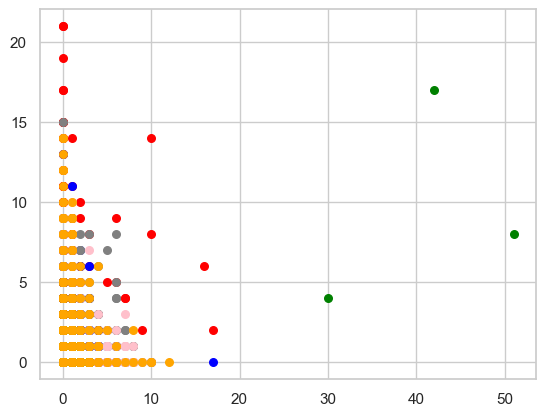

In [41]:
plt.scatter(data[y_kmeans == 0, 0], data[y_kmeans == 0, 1], s = 30, c = 'red')
plt.scatter(data[y_kmeans == 1, 0], data[y_kmeans == 1, 1], s = 30, c = 'blue')
plt.scatter(data[y_kmeans == 2, 0], data[y_kmeans == 2, 1], s = 30, c = 'green')
plt.scatter(data[y_kmeans == 3, 0], data[y_kmeans == 3, 1], s = 30, c = 'gray')
plt.scatter(data[y_kmeans == 4, 0], data[y_kmeans == 4, 1], s = 30, c = 'pink')
plt.scatter(data[y_kmeans == 5, 0], data[y_kmeans == 5, 1], s = 30, c = 'orange')

In [42]:
corpus = np.array(df['tweet_text_stem'])
y = np.array(df['cyberbullying_type'])

In [43]:
print(len(corpus))
print(corpus[0])
print(y[0])

44625
word katandandr food crapilici mkr
not_cyberbullying


In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features = 1500, min_df = 50, max_df = 0.6)
X = vectorizer.fit_transform(corpus).toarray()

In [45]:
print(len(X))
print(X)

44625
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [46]:
unigramas = vectorizer.get_feature_names_out()
print(unigramas[10:20])

['act' 'action' 'activ' 'actual' 'ad' 'add' 'address' 'admit' 'adult'
 'advic']


In [47]:
with open('tfidfmodelUNIGRAM.pickle','wb') as f:
    pickle.dump(vectorizer,f)

In [48]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer2 = TfidfVectorizer(max_features = 1500, min_df = 20, max_df = 0.6, ngram_range=(2, 2))
X2 = vectorizer2.fit_transform(corpus).toarray()

In [49]:
print(len(X2))
print(X2)

44625
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [50]:
bigramas = vectorizer2.get_feature_names_out()
print(bigramas[10:20])

['amp disgust' 'amp gay' 'amp high' 'amp make' 'amp muslim' 'amp rape'
 'amp support' 'amp white' 'andr mkr' 'anni lloyd']


In [51]:
with open('tfidfmodelBIGRAM.pickle','wb') as f:
    pickle.dump(vectorizer2,f)

In [52]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [53]:
print("Dimensions of the training set (X_train):", X_train.shape)
print("Dimensions of the test set (X_test):", X_test.shape)
print("Dimensions of the training set (y_train):", y_train.shape)
print("Dimensions of the test set (y_test):", y_test.shape)


Dimensions of the training set (X_train): (35700, 1500)
Dimensions of the test set (X_test): (8925, 1500)
Dimensions of the training set (y_train): (35700,)
Dimensions of the test set (y_test): (8925,)


In [54]:
from sklearn.model_selection import train_test_split
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size = 0.20, random_state = 0)

In [55]:
print("Dimensions of the training set (X2_train):", X2_train.shape)
print("Dimensions of the test set (X2_test):", X2_test.shape)
print("Dimensions of the training set (y2_train):", y2_train.shape)
print("Dimensions of the test set (y2_test):", y2_test.shape)

Dimensions of the training set (X2_train): (35700, 1365)
Dimensions of the test set (X2_test): (8925, 1365)
Dimensions of the training set (y2_train): (35700,)
Dimensions of the test set (y2_test): (8925,)


In [56]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(conf_matrix, classes, name):
    
    print(conf_matrix)

    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=classes)

    plt.figure(figsize=(10, 8))
    disp.plot(xticks_rotation='vertical')

    plt.title(f'Confusion Matrix - {name}')

    plt.show()


In [57]:
from sklearn.linear_model import LogisticRegression
classifier_lr = LogisticRegression(random_state = 0)
classifier_lr.fit(X_train, y_train)

classifier_lr2 = LogisticRegression(random_state = 0)
classifier_lr2.fit(X2_train, y2_train)


LogisticRegression(random_state=0)

In [58]:
y_pred_lr = classifier_lr.predict(X_test)
y_pred_lr2 = classifier_lr2.predict(X2_test)


In [59]:
precision_lr = precision_score(y_test, y_pred_lr, average='weighted')
recall_lr = recall_score(y_test, y_pred_lr, average='weighted')
accuracy_lr = accuracy_score(y_test, y_pred_lr)
f1_score_lr = f1_score(y_test, y_pred_lr, average='weighted')

precision_lr2 = precision_score(y2_test, y_pred_lr2, average='weighted')
recall_lr2 = recall_score(y2_test, y_pred_lr2, average='weighted')
accuracy_lr2 = accuracy_score(y2_test, y_pred_lr2)
f1_score_lr2 = f1_score(y2_test, y_pred_lr2, average='weighted')

print(f'                UNIGRAM               BIGRAM')
print(f'Precision:      {precision_lr:.4f}                {precision_lr2:.4f}')
print(f'Recall:         {recall_lr:.4f}                {recall_lr2:.4f}')
print(f'Accuracy:       {accuracy_lr:.4f}                {accuracy_lr2:.4f}')
print(f'F1 Score:       {f1_score_lr:.4f}                {f1_score_lr2:.4f}')


                UNIGRAM               BIGRAM
Precision:      0.8325                0.7674
Recall:         0.8281                0.6893
Accuracy:       0.8281                0.6893
F1 Score:       0.8289                0.6911


UNIGRAM
[[1588    4    2   28   16    0]
 [   0 1476    0    7   20    3]
 [   4    4 1283  109  133    9]
 [  58   13   47  646  516   43]
 [  11    9   68  335  916   13]
 [   1    5    7   48   21 1482]]


<Figure size 1000x800 with 0 Axes>

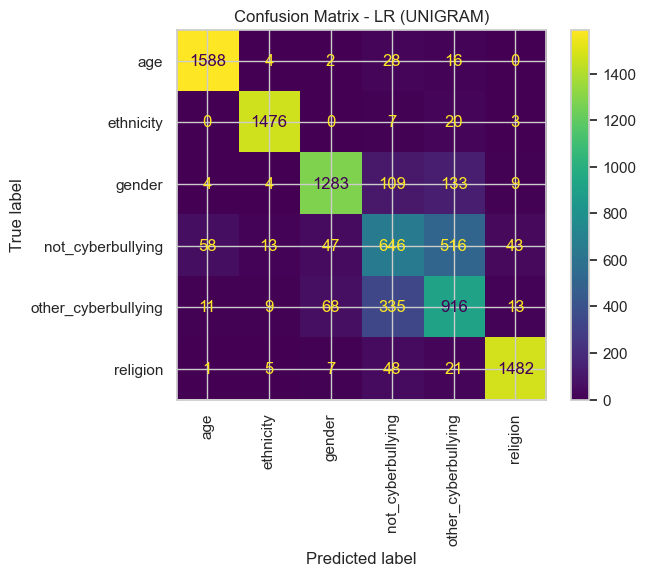

BIGRAM
[[1475    7    4   30  117    5]
 [   4 1288   20   20  162   12]
 [   5   13  996   55  459   14]
 [  38   16   26  148 1061   34]
 [  18   17   21   84 1182   30]
 [   3   21   10   33  434 1063]]


<Figure size 1000x800 with 0 Axes>

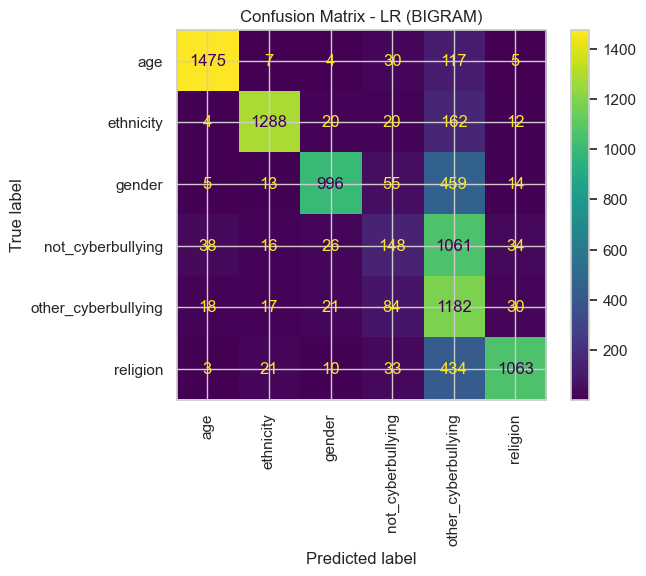

In [60]:
# UNIGRAM --------------
conf_matrix = confusion_matrix(y_test, y_pred_lr)
print("UNIGRAM")
plot_confusion_matrix(conf_matrix, np.unique(y_pred_lr), "LR (UNIGRAM)")


# BIGRAM --------------
conf_matrix2 = confusion_matrix(y2_test, y_pred_lr2)
print("BIGRAM")
plot_confusion_matrix(conf_matrix2, np.unique(y_pred_lr2), "LR (BIGRAM)")


In [61]:
# Save the classifier
with open('classifier_lr.pickle', 'wb') as f:
    pickle.dump(classifier_lr, f)

# Save the classifier
with open('classifier_lr2.pickle', 'wb') as f:
    pickle.dump(classifier_lr2, f)


In [62]:
from sklearn.tree import DecisionTreeClassifier
classifier_dt = DecisionTreeClassifier(random_state=0)

classifier_dt.fit(X_train, y_train)

classifier_dt2 = DecisionTreeClassifier(random_state=0)

classifier_dt2.fit(X2_train, y2_train)


DecisionTreeClassifier(random_state=0)

In [63]:
y_pred_dt = classifier_dt.predict(X_test)

y_pred_dt2 = classifier_dt2.predict(X2_test)


In [64]:
precision_dt = precision_score(y_test, y_pred_dt, average='weighted')
recall_dt = recall_score(y_test, y_pred_dt, average='weighted')
accuracy_dt = accuracy_score(y_test, y_pred_dt)
f1_score_dt = f1_score(y_test, y_pred_dt, average='weighted')

precision_dt2 = precision_score(y2_test, y_pred_dt2, average='weighted')
recall_dt2 = recall_score(y2_test, y_pred_dt2, average='weighted')
accuracy_dt2 = accuracy_score(y2_test, y_pred_dt2)
f1_score_dt2 = f1_score(y2_test, y_pred_dt2, average='weighted')

print(f'                UNIGRAM               BIGRAM')
print(f'Precision:      {precision_dt:.4f}                {precision_dt2:.4f}')
print(f'Recall:         {recall_dt:.4f}                {recall_dt2:.4f}')
print(f'Accuracy:       {accuracy_dt:.4f}                {accuracy_dt2:.4f}')
print(f'F1 Score:       {f1_score_dt:.4f}                {f1_score_dt2:.4f}')


                UNIGRAM               BIGRAM
Precision:      0.7987                0.7547
Recall:         0.7973                0.6826
Accuracy:       0.7973                0.6826
F1 Score:       0.7980                0.6844


UNIGRAM
[[1592    2    3   28   11    2]
 [   3 1467    5   10   13    8]
 [   1    5 1321  101  110    4]
 [  15   10   90  594  551   63]
 [   6   11  103  549  669   14]
 [   2    8   17   53   11 1473]]


<Figure size 1000x800 with 0 Axes>

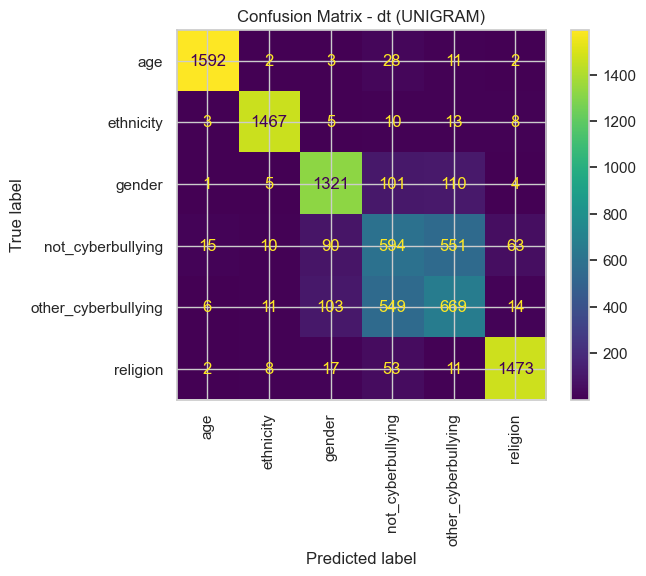

BIGRAM
[[1477    9   13   25  111    3]
 [  10 1291   18   16  159   12]
 [   6   17  992   61  454   12]
 [  48   18   27  155 1040   35]
 [  23   26   36  101 1143   23]
 [  10   31   16   48  425 1034]]


<Figure size 1000x800 with 0 Axes>

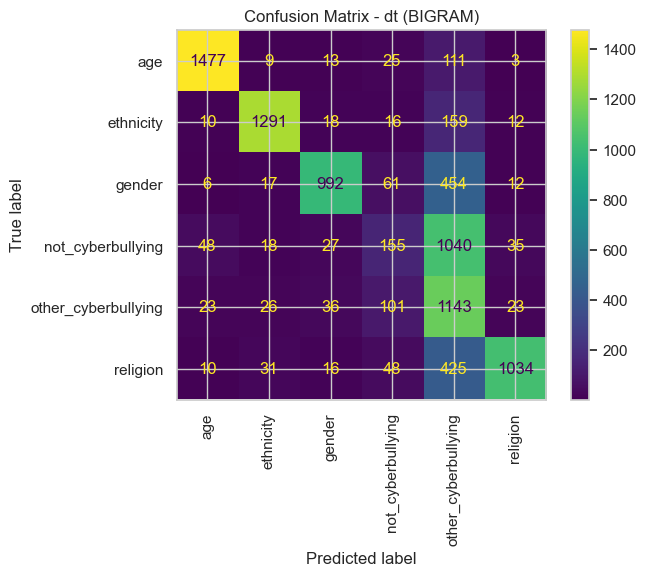

In [66]:
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print("UNIGRAM")
plot_confusion_matrix(conf_matrix, np.unique(y_pred_dt), "dt (UNIGRAM)")

conf_matrix2 = confusion_matrix(y2_test, y_pred_dt2)
print("BIGRAM")
plot_confusion_matrix(conf_matrix2, np.unique(y_pred_dt2), "dt (BIGRAM)")


In [67]:
from sklearn.svm import SVC
classifier_svm = SVC(random_state=0)
classifier_svm.fit(X_train, y_train)

classifier_svm2 = SVC(random_state=0)
classifier_svm2.fit(X2_train, y2_train)


SVC(random_state=0)

In [68]:
y_pred_svm = classifier_svm.predict(X_test)
y_pred_svm2 = classifier_svm2.predict(X2_test)

In [69]:
precision_svm = precision_score(y_test, y_pred_svm, average='weighted')
recall_svm = recall_score(y_test, y_pred_svm, average='weighted')
accuracy_svm = accuracy_score(y_test, y_pred_svm)
f1_score_svm = f1_score(y_test, y_pred_svm, average='weighted')

precision_svm2 = precision_score(y2_test, y_pred_svm2, average='weighted')
recall_svm2 = recall_score(y2_test, y_pred_svm2, average='weighted')
accuracy_svm2 = accuracy_score(y2_test, y_pred_svm2)
f1_score_svm2 = f1_score(y2_test, y_pred_svm2, average='weighted')

print(f'                UNIGRAM               BIGRAM')
print(f'Precision:      {precision_svm:.4f}                {precision_svm2:.4f}')
print(f'Recall:         {recall_svm:.4f}                {recall_svm2:.4f}')
print(f'Accuracy:       {accuracy_svm:.4f}                {accuracy_svm2:.4f}')
print(f'F1 Score:       {f1_score_svm:.4f}                {f1_score_svm2:.4f}')


                UNIGRAM               BIGRAM
Precision:      0.8360                0.7586
Recall:         0.8297                0.6877
Accuracy:       0.8297                0.6877
F1 Score:       0.8300                0.6868


UNIGRAM
[[1605    2    2   11   18    0]
 [   0 1477    0    6   18    5]
 [   0    4 1289  104  137    8]
 [  48   11   33  587  600   44]
 [  12    8   56  313  960    3]
 [   0    4    5   47   21 1487]]


<Figure size 1000x800 with 0 Axes>

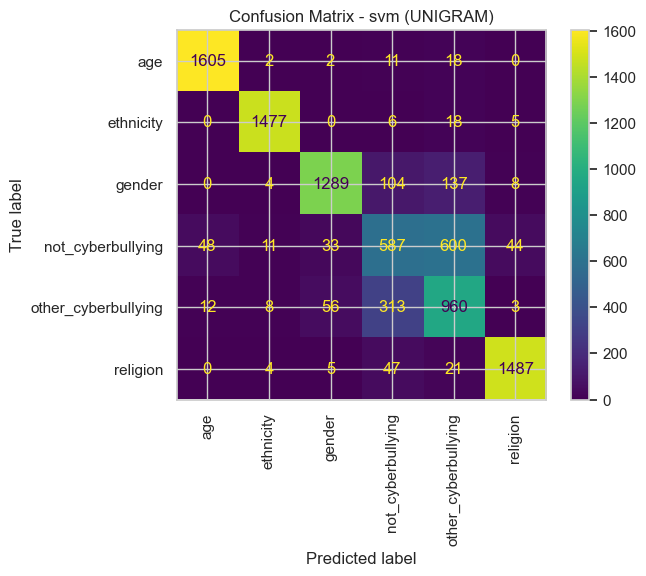

BIGRAM
[[1489   10    1   26  102   10]
 [   7 1298   18   13  152   18]
 [   7   18  998   54  449   16]
 [  43   19   26  144 1048   43]
 [  25   28   29   80 1147   43]
 [   5   25   19   27  426 1062]]


<Figure size 1000x800 with 0 Axes>

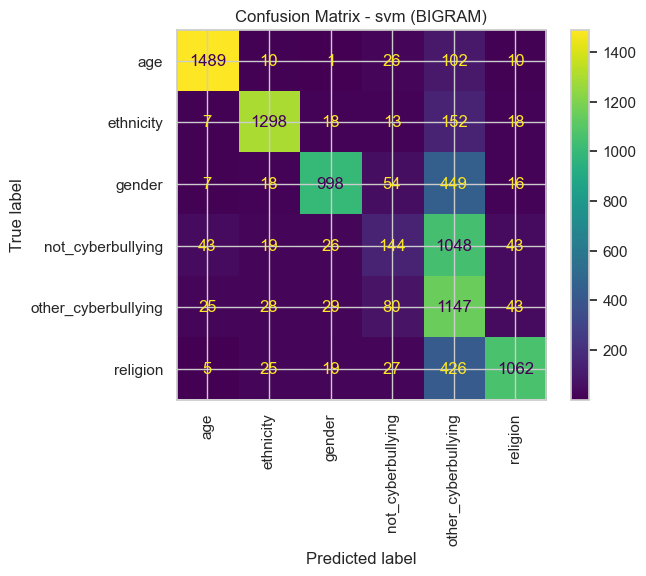

In [70]:
conf_matrix = confusion_matrix(y_test, y_pred_svm)
print("UNIGRAM")
plot_confusion_matrix(conf_matrix, np.unique(y_pred_svm), "svm (UNIGRAM)")

conf_matrix2 = confusion_matrix(y2_test, y_pred_svm2)
print("BIGRAM")
plot_confusion_matrix(conf_matrix2, np.unique(y_pred_svm2), "svm (BIGRAM)")


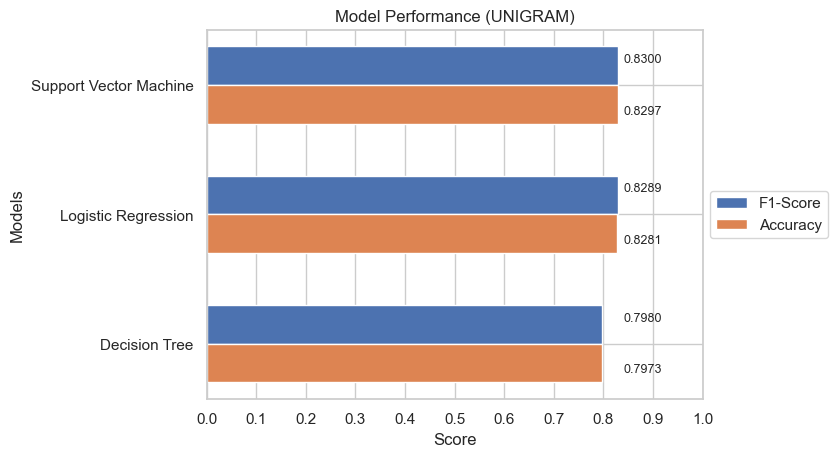

In [71]:
import numpy as np
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'Decision Tree', 'Support Vector Machine']
accuracy_results = [accuracy_lr, accuracy_dt, accuracy_svm]
f1_score_results = [f1_score_lr, f1_score_dt, f1_score_svm]

models, f1_score_results, accuracy_results = zip(*sorted(zip(models, f1_score_results, accuracy_results), key=lambda x: x[1]))

bar_width = 0.3
positions = np.arange(len(models))

bar1 = plt.barh(positions + 0.15, f1_score_results, bar_width, label='F1-Score')
bar2 = plt.barh(positions - 0.15, accuracy_results, bar_width, label='Accuracy')

plt.legend(handles=[bar1, bar2], loc='center left', bbox_to_anchor=(1, 0.5))

for i in range(len(models)):
    plt.text(0.88, positions[i] + 0.2, f'{f1_score_results[i]:.4f}', ha='center', va='center', fontsize=9)
    plt.text(0.88, positions[i] - 0.2, f'{accuracy_results[i]:.4f}', ha='center', va='center', fontsize=9)

plt.ylabel('Models')
plt.xlabel('Score')
plt.title('Model Performance (UNIGRAM)')
plt.yticks(positions, models)
plt.xticks(np.arange(0, 1.1, 0.1))

plt.show()

In [73]:
data_table1 = {
    'Model': models,
    'Accuracy': accuracy_results,
    'F1-Score': f1_score_results
}

df_table1 = pd.DataFrame(data_table1)

print("Model Results with Unigrams")
print(df_table1)
print("\n")


Model Results with Unigrams
                    Model  Accuracy  F1-Score
0           Decision Tree  0.797311  0.798000
1     Logistic Regression  0.828123  0.828915
2  Support Vector Machine  0.829692  0.829972




In [75]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform

param_grid = {
    'C': uniform(loc=0, scale=5),
    'solver': ['newton-cg', 'newton-cholesky','sag','liblinear', 'saga'],
    'penalty': ['l1', 'l2'],
    'max_iter': [25, 100, 120]
}

classifier_lr_opt = LogisticRegression(random_state=0)

random_search = RandomizedSearchCV(classifier_lr_opt, param_distributions=param_grid, n_iter=3, scoring='f1_weighted', cv=5, verbose=1, random_state=0)

random_search.fit(X_train, y_train)

best_lr_model = random_search.best_estimator_

y_pred_lr_optimized = best_lr_model.predict(X_test)
f1_score_lr_optimized = f1_score(y_test, y_pred_lr_optimized, average='weighted')

print("F1 Score before optimization:", f1_score_lr)
print("F1 Score after optimization:", f1_score_lr_optimized)
print("Best parameters found:", random_search.best_params_)



Fitting 5 folds for each of 3 candidates, totalling 15 fits
F1 Score before optimization: 0.8289145592949465
F1 Score after optimization: 0.8269826990306767
Best parameters found: {'C': 2.7440675196366238, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [76]:
with open('classifier_lr_optimized.pickle', 'wb') as f:
    pickle.dump(best_lr_model, f)


In [1]:
!pip freeze > requirements.txt


In [3]:
!pip install --upgrade setuptools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 1.7 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: setuptools
    Found existing installation: setuptools 79.0.0
    Uninstalling setuptools-79.0.0:
      Successfully uninstalled setuptools-79.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.75 requires requests_mock, which is not installed.
spyder 5.4.3 requires pyqt5<5.16, which is not installed.
spyder 5.4.3 requires pyqtwebengine<5.16, which is not installed.
conda-repo-cli 1.0.75 requires clyent==1.2.1, but you have clyent 1.2.2 which is incompatible.
conda-repo-cli 1.0.75 requires PyYAML==6.0.1, but you have pyyaml 6.0 which is incompatible.
python-lsp-black 1.2.1 requires black>=22.3.0, but you have black 0.0 which is incompatible.

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip ins